In [1]:
####this code should perform Ordinary Kriging just on the 6K res 










import os
import logging
import pandas as pd
import numpy as np
from pykrige.ok import OrdinaryKriging

# ------------------------------------------------------------------------------
# CONFIG / PATHS
# ------------------------------------------------------------------------------
# Main folder with the UGRID files:
SPATIAL_FOLDER = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID"

# We now only process the 6K resolution file.
UGRID_FILES = [
    "UGRID_Darga_6kcells_latlon.csv"
]

# Where the 8 rain CSV files live (one per year)
RAIN_FOLDER = os.path.join(SPATIAL_FOLDER, "darga rain")

# Output folder for final kriged+merged results
KRIGED_OUTPUT_BASE = os.path.join(SPATIAL_FOLDER, "kriged_merged_results")

# Years of rain data
RAIN_YEARS = [2013, 2014, 2015, 2016, 2018, 2019, 2020]

# ------------------------------------------------------------------------------
# LOGGING
# ------------------------------------------------------------------------------
logging.basicConfig(
    level=logging.INFO,
    format="%(asctime)s [%(levelname)s] %(message)s",
    handlers=[logging.StreamHandler()]
)

# ------------------------------------------------------------------------------
# STEP B1: Ordinary Kriging for One Timestep
# ------------------------------------------------------------------------------
def ordinary_kriging_for_one_timestep(rain_subset, grid_lat, grid_lon):
    """
    Perform kriging using a 'spherical' variogram model.
    :param rain_subset: DataFrame with [latitude, longitude, rainrate]
    :param grid_lat: UGRID 'latitude' array
    :param grid_lon: UGRID 'longitude' array
    :return: np.array of kriged values across the grid
    """
    sample_lat = rain_subset["latitude"].values
    sample_lon = rain_subset["longitude"].values
    sample_val = rain_subset["rainrate"].values
    
    OK = OrdinaryKriging(
        sample_lat, sample_lon, sample_val,
        variogram_model="spherical",
        verbose=False,
        enable_plotting=False
    )
    
    z_values, ss = OK.execute("points", grid_lat, grid_lon)
    return z_values

# ------------------------------------------------------------------------------
# STEP B2: Krige an Entire Year + Merge
# ------------------------------------------------------------------------------
def krige_rain_one_year(ugrid_path, rain_file, output_csv):
    """
    - Load the UGRID (latlon) file.
    - Load year of rain data [time, latitude, longitude, rainrate].
    - For each timestamp, if <3 points => fill with 0; if std==0 => fill with mean; else perform kriging.
    - Merge with UGRID static columns => final df => CSV in output_csv.
    """
    logging.info(f"=== Kriging {os.path.basename(rain_file)} onto {os.path.basename(ugrid_path)} => {output_csv}")
    
    df_ugrid = pd.read_csv(ugrid_path)
    if "latitude" not in df_ugrid.columns or "longitude" not in df_ugrid.columns:
        logging.error("[krige_rain_one_year] UGRID missing 'latitude' or 'longitude'. Aborting.")
        return
    
    if not os.path.exists(rain_file):
        logging.error(f"[krige_rain_one_year] Rain file not found: {rain_file}")
        return
    
    df_rain = pd.read_csv(rain_file)
    if "time" not in df_rain.columns:
        logging.error("[krige_rain_one_year] Rain data missing 'time' column. Aborting.")
        return
    
    unique_times = df_rain["time"].unique()
    unique_times.sort()
    logging.info(f"  Found {len(unique_times)} timestamps in {os.path.basename(rain_file)}.")
    
    grid_lat = df_ugrid["latitude"].values
    grid_lon = df_ugrid["longitude"].values
    
    results_list = []
    
    for i, tstamp in enumerate(unique_times):
        subset = df_rain[df_rain["time"] == tstamp]
        
        if len(subset) < 3:
            # Not enough points => fill with zeros
            kriged_vals = np.zeros_like(grid_lat)
        else:
            val_std = subset["rainrate"].std()
            if val_std < 1e-8:
                # Nearly constant => fill with mean value
                mean_val = subset["rainrate"].mean()
                kriged_vals = np.full_like(grid_lat, mean_val)
            else:
                try:
                    kriged_vals = ordinary_kriging_for_one_timestep(subset, grid_lat, grid_lon)
                except Exception as e:
                    logging.error(f"  Time={tstamp} kriging error => {e}, fallback=mean.")
                    mean_val = subset["rainrate"].mean()
                    kriged_vals = np.full_like(grid_lat, mean_val)
        
        df_kriged = pd.DataFrame({
            "ID": df_ugrid["ID"],
            "time": tstamp,
            "rainrate": kriged_vals
        })
        results_list.append(df_kriged)
        
        if (i+1) % 50 == 0:
            logging.info(f"  Processed {i+1}/{len(unique_times)} timesteps.")
    
    df_kriged_all = pd.concat(results_list, ignore_index=True)
    
    # Merge with static columns from UGRID
    static_cols = [c for c in df_ugrid.columns if c not in ("ID", "latitude", "longitude")]
    df_merged = pd.merge(
        df_kriged_all,
        df_ugrid[["ID", "latitude", "longitude"] + static_cols],
        on="ID",
        how="left"
    )
    
    df_merged.to_csv(output_csv, index=False)
    logging.info(f"  [DONE] Saved: {output_csv}")

# ------------------------------------------------------------------------------
# MAIN – Process only the 6K resolution
# ------------------------------------------------------------------------------
def main():
    new_ugrid_files = UGRID_FILES  # Only the 6K file is in this list now.
    
    for fname in new_ugrid_files:
        # We are processing only the 6K resolution
        latlon_ugrid_path = os.path.join(SPATIAL_FOLDER, fname)
        out_subdir = "6k_rain_kriged_merged"
        out_dir = os.path.join(KRIGED_OUTPUT_BASE, out_subdir)
        os.makedirs(out_dir, exist_ok=True)
        
        logging.info(f"--- Kriging for UGRID (6k): {fname} => Output folder: {out_dir}")
        
        for year in RAIN_YEARS:
            rain_file = os.path.join(RAIN_FOLDER, f"darga_rain_{year}.csv")
            out_csv = os.path.join(out_dir, f"darga_rain_{year}_kriged_merged.csv")
            
            krige_rain_one_year(
                ugrid_path=latlon_ugrid_path,
                rain_file=rain_file,
                output_csv=out_csv
            )

# ------------------------------------------------------------------------------
# OPTIONAL TEST – Minimal check for one final CSV (6k, 2012)
# ------------------------------------------------------------------------------
def test_kriging_results():
    test_file = os.path.join(
        KRIGED_OUTPUT_BASE,
        "6k_rain_kriged_merged",
        "darga_rain_2013_kriged_merged.csv"
    )
    if not os.path.exists(test_file):
        logging.error(f"[TEST] Not found => {test_file}.")
        return
    
    df_test = pd.read_csv(test_file, nrows=20)
    required = {"ID", "time", "rainrate", "latitude", "longitude"}
    missing = required - set(df_test.columns)
    if missing:
        logging.error(f"[TEST] Missing columns => {missing}")
    else:
        logging.info("[TEST] Found expected columns => PASSED!")

# ------------------------------------------------------------------------------
# RUN
# ------------------------------------------------------------------------------
if __name__ == "__main__":
    main()
    test_kriging_results()

2025-03-26 18:23:23,323 [INFO] --- Kriging for UGRID (6k): UGRID_Darga_6kcells_latlon.csv => Output folder: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged
2025-03-26 18:23:23,324 [INFO] === Kriging darga_rain_2013.csv onto UGRID_Darga_6kcells_latlon.csv => /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/darga_rain_2013_kriged_merged.csv
2025-03-26 18:23:26,040 [INFO]   Found 30528 timestamps in darga_rain_2013.csv.
2025-03-26 18:23:39,264 [INFO]   Processed 50/30528 timesteps.
2025-03-26 18:23:52,501 [INFO]   Processed 100/30528 timesteps.
2025-03-26 18:24:05,662 [INFO]   Processed 150/30528 timesteps.
2025-03-26 18:24:18,824 [INFO]   Processed 200/30528 timesteps.
2025-03-26 18:24:32,004 [INFO]   Processed 250/30528 timesteps.
202

In [ ]:
import os
import glob
import pandas as pd

# Path to the folder containing the kriged merged 6k rain CSV files
folder_path = "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged"

# Use glob to list all CSV files in the folder
csv_files = glob.glob(os.path.join(folder_path, "*.csv"))

# Iterate through each file and print its shape and head
for file_path in csv_files:
    print(f"File: {os.path.basename(file_path)}")
    try:
        df = pd.read_csv(file_path)
        print("Shape:", df.shape)
        print("Head:")
        print(df.head())
    except Exception as e:
        print(f"Error reading {file_path}: {e}")
    print("=" * 80)


In [1]:
import numpy as np

In [2]:
import pandas as pd
import numpy as np
import math
import os
import time

def haversine_distance(lat1, lon1, lat2, lon2):
    """
    Computes haversine distance (in meters) between two lat/lon points.
    """
    R = 6371_000  # Earth radius in meters
    from math import radians, sin, cos, atan2, sqrt
    phi1, phi2 = radians(lat1), radians(lat2)
    dphi = radians(lat2 - lat1)
    dlambda = radians(lon2 - lon1)

    a = (sin(dphi / 2) ** 2
         + cos(phi1) * cos(phi2) * sin(dlambda / 2) ** 2)
    c = 2 * atan2(sqrt(a), sqrt(1 - a))
    return R * c

def add_discharge_station_no_chunks(
    big_rain_file,
    discharge_file,
    rounding_decimals=5
):
    """
    1) Reads the entire 'big_rain_file' into memory as a pandas DataFrame.
    2) Identifies the single nearest pixel to the station lat/lon.
    3) Adds a 'discharge' column to the big DataFrame (NaN for all original rows).
    4) For each timestamp that appears in 'discharge_file', inserts a new row that:
       - Copies the nearest pixel's row (same static features, same time).
       - Overwrites lat/lon with the station's exact coords.
       - Overwrites 'discharge' with the measured station discharge.
    5) Overwrites the original CSV file (after backing it up).
    
    WARNING: This will load the entire big CSV (~50GB) into RAM at once. 
    Make sure you have enough memory to do so.
    """

    start = time.time()

    # 1) Load big file fully (this can be extremely memory-hungry!)
    print(f"Reading big file into memory: {big_rain_file}")
    df_big = pd.read_csv(big_rain_file, parse_dates=['time'])
    print(f"DataFrame shape: {df_big.shape}")
    print("Memory usage (approx):", df_big.memory_usage(deep=True).sum(), "bytes")

    # 2) Load discharge data
    print(f"Reading discharge file: {discharge_file}")
    df_dis = pd.read_csv(discharge_file, parse_dates=['date'])
    
    # Station lat/lon (rounded to avoid float issues if needed)
    station_lat_raw = df_dis['latitude'].iloc[0]
    station_lon_raw = df_dis['longitude'].iloc[0]
    station_lat = round(station_lat_raw, rounding_decimals)
    station_lon = round(station_lon_raw, rounding_decimals)

    # Create dict: {Timestamp: discharge_value}
    discharge_dict = df_dis.set_index('date')['rg_qms'].to_dict()

    # 3) Find the single nearest pixel in df_big
    print("Finding nearest pixel to the station lat/lon (may be slow with duplicates)...")
    
    # Round big file lat/lon to match station rounding
    df_big['latitude'] = df_big['latitude'].round(rounding_decimals)
    df_big['longitude'] = df_big['longitude'].round(rounding_decimals)

    # Extract unique lat/lon combos
    unique_coords = df_big[['latitude', 'longitude']].drop_duplicates().reset_index(drop=True)
    print(f"Unique pixel count: {len(unique_coords)}")

    # Haversine distance for each unique pixel
    distances = unique_coords.apply(
        lambda row: haversine_distance(
            station_lat, station_lon,
            row['latitude'], row['longitude']
        ), axis=1
    )
    min_idx = distances.idxmin()
    nearest_lat = unique_coords.loc[min_idx, 'latitude']
    nearest_lon = unique_coords.loc[min_idx, 'longitude']
    print(f"Nearest pixel found at lat={nearest_lat}, lon={nearest_lon}")

    # 4) Add 'discharge' column to df_big
    if 'discharge' not in df_big.columns:
        df_big['discharge'] = np.nan
    
    # Identify all rows that match the nearest lat/lon
    mask = (df_big['latitude'] == nearest_lat) & (df_big['longitude'] == nearest_lon)
    subset = df_big.loc[mask]

    # We'll store the new station rows here
    new_station_rows = []
    
    print("Creating new station rows for each matching time with discharge data...")
    for idx, row in subset.iterrows():
        t = row['time']
        # If we have a discharge measurement at this time, create a new row
        if t in discharge_dict:
            copied_row = row.copy()
            copied_row['latitude'] = station_lat
            copied_row['longitude'] = station_lon
            copied_row['discharge'] = discharge_dict[t]
            new_station_rows.append(copied_row)
    print(f"New station rows to add: {len(new_station_rows)}")

    # Concatenate new station rows
    if len(new_station_rows) > 0:
        station_df = pd.DataFrame(new_station_rows)
        df_big = pd.concat([df_big, station_df], ignore_index=True)
        print(f"After adding station rows, shape: {df_big.shape}")
    else:
        print("No station rows were added (no matching times).")

    # 5) Overwrite the original file (with backup)
    backup_file = big_rain_file + ".backup"
    if os.path.exists(backup_file):
        os.remove(backup_file)
    os.rename(big_rain_file, backup_file)
    
    print("Writing updated DataFrame back to CSV (this may take a while)...")
    df_big.to_csv(big_rain_file, index=False)

    end = time.time()
    print("------------------------------------------------")
    print(f"Process complete. Updated file: {big_rain_file}")
    print(f"Backup file: {backup_file}")
    print(f"Total elapsed: {end - start:.1f} seconds")

# ------------------- Usage Example -------------------
# Just set these paths and run the cell. 
# WARNING: This will attempt to load your entire ~50GB CSV into memory!
big_rain_file = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/"
    "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
    "darga_rain_2012_kriged_merged.csv"
)
discharge_file = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/"
    "dem slope UGRID/darga discharge/"
    "darga_discharge_2012.csv"
)

add_discharge_station_no_chunks(big_rain_file, discharge_file, rounding_decimals=5)


Reading big file into memory: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/darga_rain_2012_kriged_merged.csv
DataFrame shape: (192129408, 20)
Memory usage (approx): 40639111908 bytes
Reading discharge file: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge/darga_discharge_2012.csv
Finding nearest pixel to the station lat/lon (may be slow with duplicates)...
Unique pixel count: 6264
Nearest pixel found at lat=31.60025, lon=35.36532
Creating new station rows for each matching time with discharge data...
New station rows to add: 30672
After adding station rows, shape: (192160080, 21)
Writing updated DataFrame back to CSV (this may take a while)...
------------------------------------------------
Process complete. Updated file: /media/data-ssd/PINN/DATA/model dat

In [3]:
import pandas as pd
import numpy as np

def check_merged_2012(file_path, nrows=100000):
    """
    1. Reads the first nrows of the updated 2012 CSV.
    2. Prints basic shape and columns.
    3. Checks how many rows have a non-null 'discharge'.
    4. Shows a quick peek at those station rows.
    """
    print(f"Reading first {nrows} rows from: {file_path}")
    df = pd.read_csv(file_path, nrows=nrows)
    
    print("\n=== Basic Info ===")
    print(f"Shape of first {nrows} rows: {df.shape}")
    print("Columns:", list(df.columns))
    
    # If 'discharge' doesn't exist, something is off
    if 'discharge' not in df.columns:
        print("\nNo 'discharge' column found! Merge might have failed.")
        return
    
    # Station rows should have discharge != NaN
    station_rows = df[df['discharge'].notna()]
    print(f"\nNumber of station rows (discharge != NaN) in first {nrows} lines: {len(station_rows)}")
    
    if len(station_rows) > 0:
        # Peek at a few
        print("\n=== Sample of station rows ===")
        print(station_rows.head(10))
        
        # Check how many unique lat/lon in those station rows
        unique_station_coords = station_rows[['latitude','longitude']].drop_duplicates()
        print("\nUnique lat/lon among station rows (first 100k lines):")
        print(unique_station_coords)
    else:
        print("\nNo station rows found in the first 100k lines.")

# Example usage:
merged_2012_file = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/"
    "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
    "darga_rain_2012_kriged_merged.csv"
)

check_merged_2012(merged_2012_file, nrows=100000)


Reading first 100000 rows from: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/darga_rain_2012_kriged_merged.csv

=== Basic Info ===
Shape of first 100000 rows: (100000, 21)
Columns: ['ID', 'time', 'rainrate', 'latitude', 'longitude', 'AREA_2M', 'STRM_ORDER', 'STREAM_CELL', 'DEM', 'SLOPE', 'ASPECT', 'TPI', 'TRI', 'TRIRILEY', 'TRIRMSD', 'ROUGHNESS', 'FLOWDIR', 'EQUATION', 'D50MM', 'manning_n', 'discharge']

Number of station rows (discharge != NaN) in first 100000 lines: 0

No station rows found in the first 100k lines.


In [4]:
import pandas as pd

def find_any_station_rows(file_path, chunksize=500000):
    """
    Reads the CSV in chunks and looks for any rows where discharge is NOT NaN.
    Stops at the first chunk that contains such rows, printing a small sample.
    """
    print(f"Scanning {file_path} in chunks of {chunksize} to find station rows...")
    total_rows_seen = 0
    
    for i, chunk in enumerate(pd.read_csv(file_path, chunksize=chunksize), start=1):
        # Filter rows that have a non-null discharge
        station_subset = chunk[chunk['discharge'].notna()]
        
        # If we found any station rows, print a sample and stop
        if not station_subset.empty:
            print(f"Found {len(station_subset)} station rows in chunk #{i} (rows {total_rows_seen+1} to {total_rows_seen+len(chunk)}).")
            print("Here are the first 5:")
            print(station_subset.head(5))
            return
        
        total_rows_seen += len(chunk)
    
    print("No station rows found at all. If this happens unexpectedly, investigate further.")

# Example usage:
csv_2012_path = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/"
    "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
    "darga_rain_2012_kriged_merged.csv"
)

find_any_station_rows(csv_2012_path, chunksize=500000)


Scanning /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/darga_rain_2012_kriged_merged.csv in chunks of 500000 to find station rows...
Found 30672 station rows in chunk #385 (rows 192000001 to 192160080).
Here are the first 5:
             ID                 time  rainrate  latitude  longitude  AREA_2M  \
192129408  2877  2012-01-01 00:00:00       0.0  31.60015   35.36552     9095   
192129409  2877  2012-01-01 00:10:00       0.0  31.60015   35.36552     9095   
192129410  2877  2012-01-01 00:20:00       0.0  31.60015   35.36552     9095   
192129411  2877  2012-01-01 00:30:00       0.0  31.60015   35.36552     9095   
192129412  2877  2012-01-01 00:40:00       0.0  31.60015   35.36552     9095   

           STRM_ORDER  STREAM_CELL        DEM     SLOPE  ...       TPI  \
192129408           6            1 -17.316267  8.434694  ... -0.006872   
192129409      

In [6]:
import pandas as pd
import numpy as np
from collections import defaultdict

def check_station_per_time(
    file_path,
    station_lat=31.60015,
    station_lon=35.36552,
    time_col='time',
    chunksize=500000
):
    """
    Reads 'file_path' in chunks, counting how many rows match
    the given station latitude/longitude for each timestamp.
    
    Returns:
      station_count_per_time: dict {timestamp -> count of station rows}
      total_unique_times: number of distinct timestamps in the entire file
      total_rows: total number of rows in the file
    """
    print(f"Scanning file in chunks to find station rows:\n  {file_path}")
    station_count_per_time = defaultdict(int)
    all_times_encountered = set()
    total_rows = 0
    
    # Read CSV in chunks
    for chunk_i, chunk in enumerate(pd.read_csv(file_path, chunksize=chunksize, parse_dates=[time_col]), start=1):
        total_rows += len(chunk)
        # We assume the columns 'latitude' and 'longitude' exist
        # Filter out station rows
        station_mask = (chunk['latitude'] == station_lat) & (chunk['longitude'] == station_lon)
        station_subset = chunk[station_mask]
        
        # Count station rows by timestamp
        # station_subset.groupby(time_col).size() returns a Series:
        # index = timestamps, value = # of rows
        grouped = station_subset.groupby(time_col).size()
        for tstamp, count in grouped.items():
            station_count_per_time[tstamp] += count
        
        # Also gather all times from this chunk
        all_times_encountered.update(chunk[time_col].unique())
        
        print(f"  -> Processed chunk #{chunk_i}, chunk size={len(chunk)}. Total rows so far: {total_rows}")
    
    total_unique_times = len(all_times_encountered)
    print("Done scanning.")
    print(f"Total rows in file = {total_rows}")
    print(f"Total unique timestamps = {total_unique_times}")
    
    return station_count_per_time, total_unique_times, total_rows

# ------------------ Usage ------------------
updated_2012_file = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/"
    "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
    "darga_rain_2012_kriged_merged.csv"
)

# The lat/lon of your station pixel:
station_lat = 31.60015
station_lon = 35.36552

station_count_per_time, total_unique_times, total_rows = check_station_per_time(
    file_path=updated_2012_file,
    station_lat=station_lat,
    station_lon=station_lon,
    chunksize=500000
)

# Now let's see how many timestamps have 0, 1, or more station rows
counts_frequency = {}
for t, c in station_count_per_time.items():
    counts_frequency[c] = counts_frequency.get(c, 0) + 1

print("\n=== Station Row Counts Frequency ===")
for station_row_count in sorted(counts_frequency.keys()):
    print(f"  Timestamps with {station_row_count} station rows: {counts_frequency[station_row_count]}")

missing_station_times = total_unique_times - sum(counts_frequency.values())
if missing_station_times > 0:
    print(f"\nWarning: {missing_station_times} timestamps appear to have no station row recorded in station_count_per_time.")
else:
    print("\nAll timestamps are represented in station_count_per_time.")

print("\nIf you want exactly 1 station row per time, check if 'Timestamps with 1 station rows' equals total_unique_times.")


Scanning file in chunks to find station rows:
  /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/darga_rain_2012_kriged_merged.csv
  -> Processed chunk #1, chunk size=500000. Total rows so far: 500000
  -> Processed chunk #2, chunk size=500000. Total rows so far: 1000000
  -> Processed chunk #3, chunk size=500000. Total rows so far: 1500000
  -> Processed chunk #4, chunk size=500000. Total rows so far: 2000000
  -> Processed chunk #5, chunk size=500000. Total rows so far: 2500000
  -> Processed chunk #6, chunk size=500000. Total rows so far: 3000000
  -> Processed chunk #7, chunk size=500000. Total rows so far: 3500000
  -> Processed chunk #8, chunk size=500000. Total rows so far: 4000000
  -> Processed chunk #9, chunk size=500000. Total rows so far: 4500000
  -> Processed chunk #10, chunk size=500000. Total rows so far: 5000000
  -> Processed chunk #11, chunk

In [ ]:
import pandas as pd
import numpy as np
import os
import time

def ensure_one_station_row_per_time(
    file_2012,
    station_lat_actual=31.60015,   # The actual station lat
    station_lon_actual=35.36552,   # The actual station lon
    nearest_lat=31.60025,          # "Nearest pixel" lat from your merge
    nearest_lon=35.36532,          # "Nearest pixel" lon from your merge
):
    """
    Fixes an already-updated 2012 file so that every timestamp has exactly
    one station row. If a station row doesn't already exist for a time, we
    create one by copying from the nearest-lat/lon pixel's row for that time,
    then overwriting lat/lon with the station coords and setting discharge = NaN.

    1) Loads the entire CSV (~50GB) into memory (must have enough RAM).
    2) Finds times that lack a station row.
    3) Copies the row from (nearest_lat, nearest_lon) at that time, overwriting lat/lon,
       setting discharge=NaN.
    4) Concatenates new rows into df.
    5) Backs up the original file and overwrites it with the new df.

    :param file_2012: Path to the CSV for 2012 that already has a 'discharge' column.
    :param station_lat_actual: The real lat for the station row.
    :param station_lon_actual: The real lon for the station row.
    :param nearest_lat, nearest_lon: The coords of the pixel from which we copy
                                     static fields for missing times.
    """

    start_time = time.time()
    print("========================================================")
    print(f"Loading file into memory: {file_2012}")
    df = pd.read_csv(file_2012, parse_dates=['time'])
    print(f"Data loaded. Shape = {df.shape}")

    # Ensure we have a 'discharge' column
    if 'discharge' not in df.columns:
        df['discharge'] = np.nan

    # A. Identify all distinct timestamps
    all_times = df['time'].unique()
    print(f"Total unique timestamps in file: {len(all_times)}")

    # B. Identify times that already have a station row
    station_mask = (
        (df['latitude'] == station_lat_actual) &
        (df['longitude'] == station_lon_actual)
    )
    df_station = df.loc[station_mask]
    times_with_station = set(df_station['time'].unique())
    print(f"Times that already have a station row: {len(times_with_station)}")

    # C. Find which times are missing a station row
    missing_times = [t for t in all_times if t not in times_with_station]
    print(f"Times without station row: {len(missing_times)}")

    if len(missing_times) == 0:
        print("No missing station rows. Nothing to fix!")
        return

    # D. Build a DataFrame for the "nearest" pixel so we can copy from it
    #    We set an index on 'time' for quick row lookup:
    pixel_mask = (
        (df['latitude'] == nearest_lat) &
        (df['longitude'] == nearest_lon)
    )
    df_pixel = df.loc[pixel_mask].copy()
    df_pixel.set_index('time', inplace=True, drop=False)
    print(f"Nearest-pixel DataFrame shape = {df_pixel.shape}")

    # We'll store new station rows in a list to combine later
    new_rows = []
    times_not_found = []  # for error tracking

    # E. For each missing time, copy from the nearest-pixel row
    count_made = 0
    for t in missing_times:
        if t not in df_pixel.index:
            # Means we have no row for that time in the nearest pixel subset
            times_not_found.append(t)
            continue

        # If the pixel is repeated (multiple rows with same time),
        # we can just pick the first row. Usually there's exactly 1 row/time.
        template_row = df_pixel.loc[t]
        if isinstance(template_row, pd.DataFrame):
            # If the "nearest pixel" has multiple rows for the same time,
            # pick the first. (Unlikely in typical data.)
            template_row = template_row.iloc[0]

        new_row = template_row.copy()
        # Overwrite lat/lon, discharge
        new_row['latitude'] = station_lat_actual
        new_row['longitude'] = station_lon_actual
        new_row['discharge'] = np.nan  # since no measurement for this time

        new_rows.append(new_row)
        count_made += 1

    print(f"Created {count_made} new station rows.")
    if times_not_found:
        print(f"WARNING: For {len(times_not_found)} timestamps, the nearest pixel row didn't exist.")
        print("Those times are not fixed. Example of missing times:", times_not_found[:5])

    if count_made > 0:
        # Convert our new rows into a DataFrame and concatenate
        df_new = pd.DataFrame(new_rows)
        df = pd.concat([df, df_new], ignore_index=True)
        print(f"After adding new rows, final shape = {df.shape}")

    # F. Overwrite the file with a backup
    backup_path = file_2012 + ".pre_fixed_backup"
    if os.path.exists(backup_path):
        os.remove(backup_path)
    os.rename(file_2012, backup_path)

    print("Writing final DataFrame to CSV (this may take a while)...")
    df.to_csv(file_2012, index=False)

    end_time = time.time()
    print("--------------------------------------------------------")
    print(f"Fix complete. Elapsed time: {end_time - start_time:.1f} sec")
    print(f"Created {count_made} new station rows.")
    print(f"Backup was saved to {backup_path}")
    if times_not_found:
        print("Some times had no 'nearest pixel' row and remain missing a station row. See warnings above.")

# ------------------ Usage ------------------
file_2012 = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/"
    "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
    "darga_rain_2012_kriged_merged.csv"
)

# This is the lat/lon you want in the final station row:
station_lat_actual = 31.60015
station_lon_actual = 35.36552

# This is the pixel lat/lon from which you copy static/dynamic data
# for times that had no station measurement:
nearest_lat = 31.60025
nearest_lon = 35.36532

ensure_one_station_row_per_time(
    file_2012,
    station_lat_actual=station_lat_actual,
    station_lon_actual=station_lon_actual,
    nearest_lat=nearest_lat,
    nearest_lon=nearest_lon
)


Loading file into memory: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/darga_rain_2012_kriged_merged.csv


In [2]:
%%time
import os
import pandas as pd
import numpy as np
import math
import time

def chunk_fix_station_rows(
    big_rain_file,
    discharge_file,
    output_file,
    station_lat_actual=31.60015,   # The actual station lat
    station_lon_actual=35.36552,   # The actual station lon
    nearest_lat=31.60025,          # The lat of the "template" pixel
    nearest_lon=35.36532,          # The lon of the "template" pixel
    time_col='time',
    chunksize=200_000
):
    """
    Ensures each timestamp in 'big_rain_file' has exactly one station row (lat/lon=station_lat_actual/station_lon_actual).
    This is done chunk by chunk, so we don't load all 50GB into memory at once.

    Steps:
      1) Read 'discharge_file' fully to build {timestamp -> discharge_value}.
      2) Parse headers from 'big_rain_file' and initialize 'output_file' (CSV).
      3) Read 'big_rain_file' in chunks:
         - Ensure 'discharge' column exists.
         - For each time in the chunk:
             * If multiple station rows, keep only one.
             * If no station row, clone the row at (nearest_lat, nearest_lon) for that time,
               set lat/lon to station_lat_actual/station_lon_actual, and fill discharge (if present).
      4) After all chunks, rename big_rain_file -> .backup, rename output_file -> big_rain_file.
    
    Assumes:
      - big_rain_file is sorted by ascending 'time'.
      - (nearest_lat, nearest_lon) always exist for each time step.
      - Enough disk space is available to hold the new CSV until final rename.
    """
    start_time = time.time()
    print("=====================================================")
    print("LOADING DISCHARGE DATA INTO MEMORY...")
    df_dis = pd.read_csv(discharge_file, parse_dates=['date'])
    discharge_dict = df_dis.set_index('date')['rg_qms'].to_dict()
    print(f"Discharge dictionary loaded with {len(discharge_dict)} entries.")
    
    print(f"\nREADING HEADERS FROM {big_rain_file}...")
    header_df = pd.read_csv(big_rain_file, nrows=0)
    columns = list(header_df.columns)
    if 'discharge' not in columns:
        columns.append('discharge')
    
    # Initialize output file
    if os.path.exists(output_file):
        os.remove(output_file)
    
    with open(output_file, 'w', encoding='utf-8') as f_out:
        f_out.write(",".join(columns) + "\n")
    print(f"Output CSV initialized: {output_file}")
    
    print(f"PROCESSING {big_rain_file} IN CHUNKS OF {chunksize}...")
    chunk_iter = pd.read_csv(big_rain_file, chunksize=chunksize, parse_dates=[time_col])
    
    total_rows_written = 0
    chunk_count = 0
    
    for chunk in chunk_iter:
        chunk_count += 1
        chunk_start = time.time()
        
        # Ensure 'discharge' column
        if 'discharge' not in chunk.columns:
            chunk['discharge'] = np.nan
        
        # We'll store info about station/nearest in dictionaries
        times_info = {}
        
        # Collect row indices for station or nearest pixel by time
        for idx, row in chunk.iterrows():
            tval = row[time_col]
            if tval not in times_info:
                times_info[tval] = {
                    'station_rows': [],
                    'nearest_rows': []
                }
            # If row is the station row
            if (row['latitude'] == station_lat_actual) and (row['longitude'] == station_lon_actual):
                times_info[tval]['station_rows'].append(idx)
            # If row is the nearest pixel row
            if (row['latitude'] == nearest_lat) and (row['longitude'] == nearest_lon):
                times_info[tval]['nearest_rows'].append(idx)
        
        newly_created_rows = []
        
        # Fix each time in the chunk
        for tval, info in times_info.items():
            station_idx_list = info['station_rows']
            nearest_idx_list = info['nearest_rows']
            
            # If multiple station rows, keep only one
            if len(station_idx_list) > 1:
                # drop all but the first
                for extra_idx in station_idx_list[1:]:
                    chunk.drop(extra_idx, inplace=True)
            
            # If no station row, create one if nearest row exists
            if len(station_idx_list) == 0:
                if len(nearest_idx_list) == 0:
                    # can't fix this time if nearest row doesn't exist
                    continue
                # clone the first nearest row
                nr_idx = nearest_idx_list[0]
                row_to_clone = chunk.loc[nr_idx].copy()
                row_to_clone['latitude'] = station_lat_actual
                row_to_clone['longitude'] = station_lon_actual
                # set discharge if we have it
                row_to_clone['discharge'] = discharge_dict.get(tval, np.nan)
                newly_created_rows.append(row_to_clone)
        
        # Append newly created rows
        if newly_created_rows:
            new_df = pd.DataFrame(newly_created_rows)
            chunk = pd.concat([chunk, new_df], ignore_index=True)
        
        # Sort chunk by time again (optional)
        chunk.sort_values(by=time_col, inplace=True)
        
        # Append to output CSV
        chunk.to_csv(output_file, mode='a', header=False, index=False)
        total_rows_written += len(chunk)
        
        chunk_end = time.time()
        print(
            f"  -> Chunk #{chunk_count} processed in {chunk_end - chunk_start:.1f}s. "
            f"Rows output: {len(chunk)}; newly added station rows: {len(newly_created_rows)}."
        )
    
    print(f"\nAll chunks processed. Total rows written: {total_rows_written}.")
    
    # Rename old file -> .backup, and rename output to original
    backup_file = big_rain_file + ".backup"
    if os.path.exists(backup_file):
        os.remove(backup_file)
    os.rename(big_rain_file, backup_file)
    os.rename(output_file, big_rain_file)
    
    end_time = time.time()
    print("=====================================================")
    print(f"Done! Wrote final merged data to {big_rain_file}")
    print(f"Original file was backed up to {backup_file}")
    print(f"Elapsed time: {end_time - start_time:.1f} seconds.")

# ============ USAGE EXAMPLE IN ONE CELL =============

# 1) Make sure the combined_output directory exists:
output_dir = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/"
    "dem slope UGRID/combined_output/"
)
os.makedirs(output_dir, exist_ok=True)

# 2) Define file paths
big_rain_2012 = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/"
    "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
    "darga_rain_2012_kriged_merged.csv"
)
discharge_2012 = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/"
    "dem slope UGRID/darga discharge/darga_discharge_2012.csv"
)
output_temp = os.path.join(output_dir, "darga_rain_2012_temp.csv")

# 3) Call the function
chunk_fix_station_rows(
    big_rain_file=big_rain_2012,
    discharge_file=discharge_2012,
    output_file=output_temp,
    station_lat_actual=31.60015,   # Station lat
    station_lon_actual=35.36552,   # Station lon
    nearest_lat=31.60025,          # The nearest pixel lat from your logs
    nearest_lon=35.36532,          # The nearest pixel lon
    time_col='time',
    chunksize=200000
)


LOADING DISCHARGE DATA INTO MEMORY...
Discharge dictionary loaded with 30672 entries.

READING HEADERS FROM /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/darga_rain_2012_kriged_merged.csv...
Output CSV initialized: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/combined_output/darga_rain_2012_temp.csv
PROCESSING /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/darga_rain_2012_kriged_merged.csv IN CHUNKS OF 200000...
  -> Chunk #1 processed in 5.8s. Rows output: 200032; newly added station rows: 32.
  -> Chunk #2 processed in 6.2s. Rows output: 200032; newly added station rows: 32.
  -> Chunk #3 processed in 6.2s. Rows output: 200032; newly added s

In [3]:
import pandas as pd
import numpy as np
from collections import defaultdict

def verify_station_one_per_time(
    file_path,
    station_lat=31.60015,
    station_lon=35.36552,
    chunksize=500000,
    time_col='time'
):
    """
    1) Prints the first 5 rows of 'file_path' (similar to df.head()).
    2) Reads the entire file in chunks to count how many station rows 
       (lat=station_lat, lon=station_lon) exist per timestamp.
    3) Prints a frequency distribution of {X station rows -> N timestamps}.
    4) Displays the first 4 station rows encountered in the file.
    """

    print("=== Showing the first 5 rows of the CSV ===")
    df_head = pd.read_csv(file_path, nrows=5)
    print(df_head)
    
    print("\n=== Verifying that each timestamp has exactly one station row ===")
    station_count_per_time = defaultdict(int)  # {timestamp -> count of station rows}
    all_times = set()  # keep track of every timestamp we see
    first_station_rows = []  # store up to 4 examples

    # Chunked reading so we don't load all ~50GB at once
    chunk_iter = pd.read_csv(file_path, chunksize=chunksize, parse_dates=[time_col])

    total_rows = 0
    chunk_number = 0

    for chunk in chunk_iter:
        chunk_number += 1
        total_rows += len(chunk)

        # Identify all station rows in this chunk
        mask_station = (chunk['latitude'] == station_lat) & (chunk['longitude'] == station_lon)
        station_subset = chunk[mask_station]

        # For each station row, increment counter for that timestamp
        # also keep the row if we haven't stored 4 examples yet
        for idx, row in station_subset.iterrows():
            t = row[time_col]
            station_count_per_time[t] += 1
            if len(first_station_rows) < 4:
                first_station_rows.append(row)

        # Add all timestamps from this chunk
        all_times.update(chunk[time_col].unique())

        print(f"  -> Processed chunk #{chunk_number}, chunk size={len(chunk)}. Total rows so far: {total_rows}")

    print("\n=== Finished reading all chunks ===")
    print(f"Total rows in the file: {total_rows}")
    print(f"Total unique timestamps found: {len(all_times)}")

    # Build a distribution: how many timestamps have X station rows?
    distribution = defaultdict(int)
    for t in all_times:
        c = station_count_per_time[t]  # 0 if we never recorded a station row for that time
        distribution[c] += 1

    print("\n=== Frequency of 'station rows per timestamp' ===")
    for station_row_count in sorted(distribution.keys()):
        print(f"  Timestamps with {station_row_count} station rows: {distribution[station_row_count]}")

    # If you want EXACTLY 1 station row for each timestamp, ideally:
    # Timestamps with 1 station rows == len(all_times)

    # Show the first 4 station rows we encountered
    print("\n=== First 4 station rows found in the entire file ===")
    if first_station_rows:
        sample_df = pd.DataFrame(first_station_rows)
        print(sample_df)
    else:
        print("No station rows found at all!")

# ---------------- USAGE ----------------
updated_2012_file = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/"
    "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
    "darga_rain_2012_kriged_merged.csv"
)

verify_station_one_per_time(
    file_path=updated_2012_file,
    station_lat=31.60015,
    station_lon=35.36552,
    chunksize=500000,
    time_col='time'
)


=== Showing the first 5 rows of the CSV ===
     ID        time  rainrate  latitude  longitude  AREA_2M  STRM_ORDER  \
0     1  2012-01-01       0.0  31.58013   35.26646   260847           3   
1  3179  2012-01-01       0.0  31.61337   35.29439     9095           6   
2  3178  2012-01-01       0.0  31.61375   35.29270    36378           3   
3  3177  2012-01-01       0.0  31.61567   35.29101     9095           3   
4  3176  2012-01-01       0.0  31.61567   35.28988     9095           3   

   STREAM_CELL         DEM      SLOPE  ...       TPI       TRI  TRIRILEY  \
0            1  509.220426  15.650532  ...  0.000826  0.881682  2.838051   
1            0  265.560561   8.122053  ...  0.003910  0.449740  1.437988   
2            1  282.249689  12.138307  ... -0.006958  0.676907  2.195701   
3            1  284.814552   9.225767  ...  0.005020  0.529238  1.733235   
4            0  294.988740   9.746141  ... -0.019467  0.542927  1.728144   

    TRIRMSD  ROUGHNESS    FLOWDIR  EQUATION D50M

In [6]:
import os
import pandas as pd

def remove_discharge_column_inplace(csv_file, chunksize=200_000, column_name="discharge"):
    """
    Removes 'discharge' column from a large CSV. It uses a temp file internally
    but does NOT keep the original file as a backup after completion.
    
    WARNING:
      - If the process fails midway, your original file is lost or incomplete.
      - For safety, it's better to keep a backup.

    :param csv_file: Path to the large CSV (it will be overwritten).
    :param chunksize: Rows per chunk to keep memory usage lower.
    :param column_name: Column to remove (default "discharge").
    """
    print("===================================================")
    print(f"Removing column '{column_name}' from: {csv_file}")
    temp_file = os.path.join(os.path.dirname(csv_file), "temp_remove_discharge.csv")

    # 1) Check if the file actually has the column
    header_df = pd.read_csv(csv_file, nrows=0)
    original_cols = list(header_df.columns)
    if column_name not in original_cols:
        print(f"Column '{column_name}' not found. No changes needed.")
        return

    # Prepare the new column list
    new_cols = [col for col in original_cols if col != column_name]

    # 2) Initialize temp file with the new header
    if os.path.exists(temp_file):
        os.remove(temp_file)
    with open(temp_file, "w", encoding="utf-8") as f_out:
        f_out.write(",".join(new_cols) + "\n")

    # 3) Read original in chunks, drop column, and append to temp
    total_rows = 0
    chunk_i = 0
    for chunk in pd.read_csv(csv_file, chunksize=chunksize):
        chunk_i += 1
        before = len(chunk)
        chunk.drop(columns=[column_name], inplace=True)
        chunk.to_csv(temp_file, mode='a', header=False, index=False)
        total_rows += len(chunk)
        print(f"Chunk #{chunk_i}: read {before} rows, wrote {len(chunk)} rows. Total so far={total_rows}.")

    # 4) Overwrite the original file with the temp
    #    First, remove the original file so we can rename the temp into place.
    os.remove(csv_file)          # <-- permanently removes original
    os.rename(temp_file, csv_file)

    print("===================================================")
    print(f"Done removing '{column_name}'. Final CSV => {csv_file}")
    print(f"Total rows written: {total_rows}")
    print("NO BACKUP WAS KEPT. If something went wrong, original data is lost.")

# ------------------- Usage Example -------------------
if __name__ == "__main__":
    csv_file = (
        "/media/data-ssd/PINN/DATA/model data after proccessing/"
        "full POC model/3 final files according to spatial PINN Hebrew/"
        "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
        "darga_rain_2012_kriged_merged.csv"
    )
    remove_discharge_column_inplace(csv_file, chunksize=200_000, column_name="discharge")


Removing column 'discharge' from: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/darga_rain_2012_kriged_merged.csv
Chunk #1: read 200000 rows, wrote 200000 rows. Total so far=200000.
Chunk #2: read 200000 rows, wrote 200000 rows. Total so far=400000.
Chunk #3: read 200000 rows, wrote 200000 rows. Total so far=600000.
Chunk #4: read 200000 rows, wrote 200000 rows. Total so far=800000.
Chunk #5: read 200000 rows, wrote 200000 rows. Total so far=1000000.
Chunk #6: read 200000 rows, wrote 200000 rows. Total so far=1200000.
Chunk #7: read 200000 rows, wrote 200000 rows. Total so far=1400000.
Chunk #8: read 200000 rows, wrote 200000 rows. Total so far=1600000.
Chunk #9: read 200000 rows, wrote 200000 rows. Total so far=1800000.
Chunk #10: read 200000 rows, wrote 200000 rows. Total so far=2000000.
Chunk #11: read 200000 rows, wrote 200000 rows. Total so far=2200000

In [7]:
pip install pyarrow


Looking in indexes: https://pypi.org/simple, https://pypi.ngc.nvidia.com
Note: you may need to restart the kernel to use updated packages.


In [2]:
"""
===================== PYARROW INSTALLATION NOTES =====================
1) If you're using a conda environment (recommended), ensure it's activated:
     conda activate gpu

2) Remove any conflicting pyarrow versions:
     conda remove pyarrow
     pip uninstall pyarrow  (if needed)

3) Reinstall pyarrow from conda-forge:
     conda install -c conda-forge pyarrow

Alternatively, if you prefer pip within your conda env:
     pip install --upgrade --force-reinstall pyarrow

Make sure Jupyter is running in the same environment where pyarrow is installed.
    import sys
    print(sys.executable)
Check that it matches your conda env "gpu" path.

===================== CSV TO PARQUET CODE =====================
"""

import os
import pandas as pd
import pyarrow as pa
import pyarrow.parquet as pq

def csv_to_parquet_chunked(
    csv_file,
    parquet_file,
    chunksize=2_000_000,
    compression="snappy"
):
    """
    Converts a large CSV to a single Parquet file in a chunked manner
    so we don't need to load the entire file (~50GB) into memory at once.

    :param csv_file: Path to the input CSV.
    :param parquet_file: Path to the output Parquet file.
    :param chunksize: Number of rows to read per chunk (tune based on your RAM).
    :param compression: Parquet compression codec (e.g. 'snappy', 'gzip', None, etc.)
    """
    print(f"=== Converting CSV to Parquet ===")
    print(f"Source CSV: {csv_file}")
    print(f"Target Parquet: {parquet_file}")
    print(f"Chunksize: {chunksize}, compression: {compression}\n")

    total_rows = 0
    chunk_index = 0
    writer = None  # Will become a pyarrow.ParquetWriter once we read the first chunk

    for chunk_df in pd.read_csv(csv_file, chunksize=chunksize):
        chunk_index += 1
        rows_in_chunk = len(chunk_df)
        total_rows += rows_in_chunk
        
        # Convert this pandas chunk to an Arrow table
        table = pa.Table.from_pandas(chunk_df)

        # If first chunk, open a new ParquetWriter with the schema
        if writer is None:
            writer = pq.ParquetWriter(
                parquet_file,
                table.schema,
                compression=compression
            )
        
        # Write this chunk
        writer.write_table(table)
        
        print(f"Chunk #{chunk_index}: read {rows_in_chunk} rows, total so far: {total_rows}")
    
    # Close the Parquet writer (if we wrote at least one chunk)
    if writer is not None:
        writer.close()
        print(f"\nDone. {total_rows} total rows written to {parquet_file}.")
    else:
        print("No data found in CSV — no Parquet created.")


# ====================== USAGE EXAMPLE ======================
if __name__ == "__main__":
    csv_input = (
        "/media/data-ssd/PINN/DATA/model data after proccessing/"
        "full POC model/3 final files according to spatial PINN Hebrew/"
        "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
        "darga_rain_2012_kriged_merged.csv"
    )
    parquet_output = (
        "/media/data-ssd/PINN/DATA/model data after proccessing/"
        "full POC model/3 final files according to spatial PINN Hebrew/"
        "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
        "darga_rain_2012_kriged_merged.parquet"
    )

    # Adjust chunksize depending on your system's RAM
    csv_to_parquet_chunked(
        csv_file=csv_input,
        parquet_file=parquet_output,
        chunksize=2_000_000, 
        compression="snappy"
    )


=== Converting CSV to Parquet ===
Source CSV: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/darga_rain_2012_kriged_merged.csv
Target Parquet: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/darga_rain_2012_kriged_merged.parquet
Chunksize: 2000000, compression: snappy

Chunk #1: read 2000000 rows, total so far: 2000000
Chunk #2: read 2000000 rows, total so far: 4000000
Chunk #3: read 2000000 rows, total so far: 6000000
Chunk #4: read 2000000 rows, total so far: 8000000
Chunk #5: read 2000000 rows, total so far: 10000000
Chunk #6: read 2000000 rows, total so far: 12000000
Chunk #7: read 2000000 rows, total so far: 14000000
Chunk #8: read 2000000 rows, total so far: 16000000
Chunk #9: read 2000000 rows, total so far: 18000000
Chunk #

In [3]:
import pyarrow.parquet as pq

def check_parquet_file(parquet_path):
    """
    Checks basic metadata of a large Parquet file, then loads
    a small sample from the first row group.
    
    Prints:
      - Number of row groups
      - Total row count
      - Column names and schema
      - A sample (first 5 rows) from the first row group
      - Approx 'shape': (total_rows, number_of_columns)
    """
    print("=== Checking Parquet file ===")
    print(f"File: {parquet_path}\n")

    # 1) Open the Parquet file for metadata
    pqfile = pq.ParquetFile(parquet_path)
    
    # Number of row groups
    rg_count = pqfile.num_row_groups
    print(f"Row groups: {rg_count}")

    # Sum up all row-group row counts
    total_rows = sum(pqfile.metadata.row_group(i).num_rows for i in range(rg_count))
    print(f"Total rows (from metadata): {total_rows}")

    # Schema info
    schema = pqfile.schema_arrow  # or pqfile.schema
    col_names = schema.names
    print(f"Columns: {col_names}")
    print("\n=== Schema Details ===")
    print(schema)

    # 2) Read a small sample from the first row group
    #    Convert to pandas for an easy print of the top few rows.
    if rg_count > 0:
        first_rg_table = pqfile.read_row_group(0)
        df_sample = first_rg_table.to_pandas().head(5)
        print("\n=== Sample Rows from Row Group #0 (first 5) ===")
        print(df_sample)
    else:
        print("\nNo row groups to sample from (file is empty).")

    # 3) Print approximate shape
    n_cols = len(col_names)
    print(f"\nApprox shape: ({total_rows}, {n_cols})")


# ------------------- Usage Example -------------------
if __name__ == "__main__":
    parquet_file = (
        "/media/data-ssd/PINN/DATA/model data after proccessing/"
        "full POC model/3 final files according to spatial PINN Hebrew/"
        "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
        "darga_rain_2012_kriged_merged.parquet"
    )
    check_parquet_file(parquet_file)


=== Checking Parquet file ===
File: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/darga_rain_2012_kriged_merged.parquet

Row groups: 193
Total rows (from metadata): 192190731
Columns: ['ID', 'time', 'rainrate', 'latitude', 'longitude', 'AREA_2M', 'STRM_ORDER', 'STREAM_CELL', 'DEM', 'SLOPE', 'ASPECT', 'TPI', 'TRI', 'TRIRILEY', 'TRIRMSD', 'ROUGHNESS', 'FLOWDIR', 'EQUATION', 'D50MM', 'manning_n']

=== Schema Details ===
ID: int64
time: string
rainrate: double
latitude: double
longitude: double
AREA_2M: int64
STRM_ORDER: int64
STREAM_CELL: int64
DEM: double
SLOPE: double
ASPECT: double
TPI: double
TRI: double
TRIRILEY: double
TRIRMSD: double
ROUGHNESS: double
FLOWDIR: double
EQUATION: string
D50MM: double
manning_n: double
-- schema metadata --
pandas: '{"index_columns": [{"kind": "range", "name": null, "start": 0, "' + 2531

=== Sample Rows from Row Group #0 (

Reading rows where time == '2012-01-01' from /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/darga_rain_2012_kriged_merged.parquet
Shape of this time slice: (4762, 20) rows x 20 cols


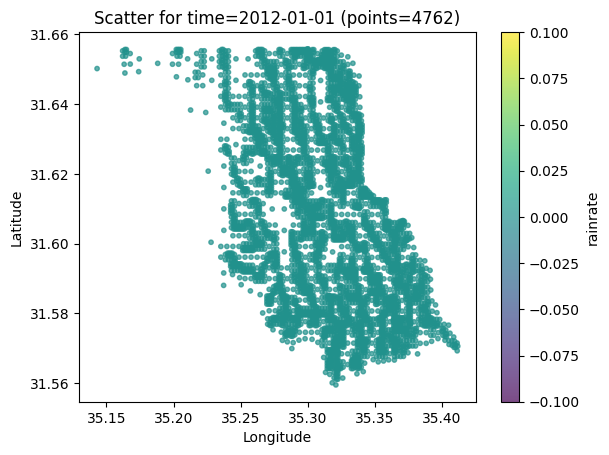

In [4]:
import pyarrow.parquet as pq
import pandas as pd
import matplotlib.pyplot as plt

def scatter_first_timestamp(parquet_file, earliest_time_str="2012-01-01"):
    """
    Loads all rows where 'time' == earliest_time_str from the Parquet file,
    then plots longitude vs. latitude on a scatter plot, colored by 'rainrate'.
    """
    print(f"Reading rows where time == '{earliest_time_str}' from {parquet_file}")
    # Attempt filter pushdown. 
    # Note: Only works if 'time' is a top-level column (not nested) 
    # and your Parquet has row group stats for time.
    table = pq.read_table(
        source=parquet_file, 
        filters=[('time', '==', earliest_time_str)]
    )
    df = table.to_pandas()
    print(f"Shape of this time slice: {df.shape} rows x {len(df.columns)} cols")

    # Plot:
    plt.figure()  # single figure
    sc = plt.scatter(
        df["longitude"], 
        df["latitude"], 
        c=df["rainrate"], 
        s=10, 
        alpha=0.7
    )
    plt.colorbar(sc, label="rainrate")
    plt.title(f"Scatter for time={earliest_time_str} (points={len(df)})")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.show()

# Usage example:
if __name__ == "__main__":
    parquet_file = (
        "/media/data-ssd/PINN/DATA/model data after proccessing/"
        "full POC model/3 final files according to spatial PINN Hebrew/"
        "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
        "darga_rain_2012_kriged_merged.parquet"
    )
    scatter_first_timestamp(parquet_file, earliest_time_str="2012-01-01")


Earliest timestamp found: 2012-01-01
Rows matching '2012-01-01': 4762


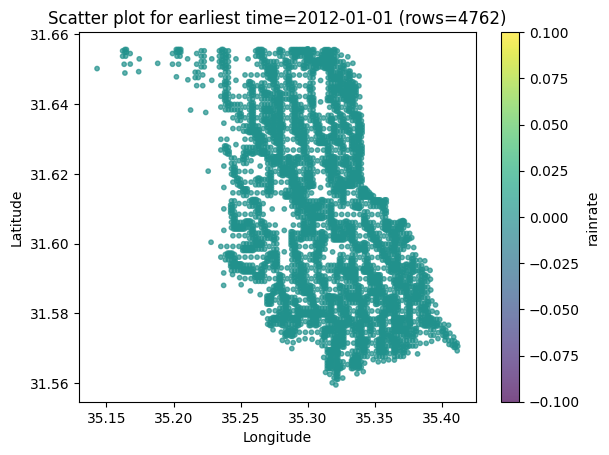

In [5]:
import pyarrow.parquet as pq
import pandas as pd
import matplotlib.pyplot as plt

def get_earliest_timestamp(parquet_file, time_col='time', row_group_index=0):
    """
    Reads the specified row group (default 0) from the Parquet file,
    finds the minimum timestamp in 'time_col', and returns it as a string.
    """
    pf = pq.ParquetFile(parquet_file)
    table = pf.read_row_group(row_group_index)
    df = table.to_pandas()
    
    # Convert time_col to string if needed
    if pd.api.types.is_datetime64_any_dtype(df[time_col]):
        # If it's already datetime, convert to ISO string
        earliest_time = df[time_col].min().strftime("%Y-%m-%d %H:%M:%S")
    else:
        # If it's a string column, pick the lexicographically smallest
        earliest_time = df[time_col].min()
    return earliest_time

def scatter_earliest_timestamp(parquet_file, time_col='time'):
    """
    1) Find earliest timestamp in row group #0 (or whichever you prefer).
    2) Read & filter all rows for that timestamp from the Parquet file.
    3) Scatter-plot those ~6000 points by longitude vs. latitude, colored by rainrate.
    """
    # 1) Identify earliest timestamp
    earliest_time_str = get_earliest_timestamp(parquet_file, time_col=time_col)
    print(f"Earliest timestamp found: {earliest_time_str}")

    # 2) Read all rows for that timestamp. Attempt filter pushdown:
    table = pq.read_table(
        source=parquet_file,
        filters=[(time_col, '==', earliest_time_str)]
    )
    df = table.to_pandas()
    print(f"Rows matching '{earliest_time_str}': {len(df)}")

    # 3) Scatter plot
    plt.figure()
    sc = plt.scatter(
        df['longitude'],
        df['latitude'],
        c=df['rainrate'],
        s=10,
        alpha=0.7
    )
    plt.colorbar(sc, label='rainrate')
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.title(f"Scatter plot for earliest time={earliest_time_str} (rows={len(df)})")
    plt.show()

# ================== USAGE EXAMPLE ===================
if __name__ == "__main__":
    parquet_file = (
        "/media/data-ssd/PINN/DATA/model data after proccessing/"
        "full POC model/3 final files according to spatial PINN Hebrew/"
        "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
        "darga_rain_2012_kriged_merged.parquet"
    )
    scatter_earliest_timestamp(parquet_file, time_col='time')


Gathering all timestamps...
Found 30792 distinct times in the file.
Second-earliest time: 2012-01-01 00:00:00
Scatter for time='2012-01-01 00:00:00', found 1504 rows


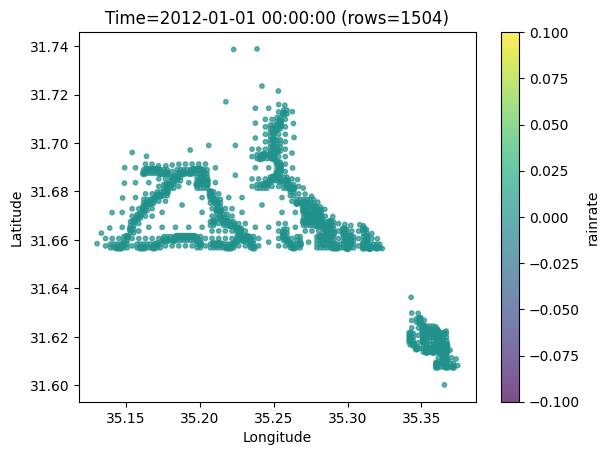

In [6]:
import pyarrow.parquet as pq
import pandas as pd
import matplotlib.pyplot as plt

def gather_all_times(parquet_file, time_col='time'):
    """
    Reads every row group from 'parquet_file' but only the 'time' column,
    aggregates distinct values across the entire file.

    WARNING: If you have an enormous number of distinct times (millions),
    this might become large. Typically a single year of 10-min intervals is okay.
    """
    pf = pq.ParquetFile(parquet_file)
    row_group_count = pf.num_row_groups

    times_collected = []

    for rg_idx in range(row_group_count):
        # Read just the time column for this row group
        table = pf.read_row_group(rg_idx, columns=[time_col])
        df_time = table.to_pandas()

        # If the time column is datetime, convert to Timestamps
        # If it's string, keep as string
        # We'll just extend our list
        times_collected.extend(df_time[time_col].tolist())

    # Convert to pandas Series, drop duplicates, sort
    times_series = pd.Series(times_collected)
    
    # If it's numeric or string, we sort lexicographically
    # If it's datetime, we sort by datetime order
    if pd.api.types.is_datetime64_any_dtype(times_series):
        # It's datetime
        unique_times = times_series.drop_duplicates().sort_values()
    else:
        # Assume string or numeric
        unique_times = times_series.drop_duplicates().sort_values()

    return unique_times.reset_index(drop=True)


def scatter_timestamp(parquet_file, time_value, time_col='time'):
    """
    Reads & filters the Parquet for rows matching 'time_value'
    and scatter-plots them by longitude vs. latitude, colored by rainrate.
    """
    table = pq.read_table(
        source=parquet_file,
        filters=[(time_col, '==', time_value)]
    )
    df = table.to_pandas()

    print(f"Scatter for time='{time_value}', found {len(df)} rows")

    plt.figure()
    sc = plt.scatter(
        df['longitude'],
        df['latitude'],
        c=df['rainrate'],
        s=10,
        alpha=0.7
    )
    plt.colorbar(sc, label='rainrate')
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.title(f"Time={time_value} (rows={len(df)})")
    plt.show()


def scatter_second_time_frame(parquet_file, time_col='time'):
    """
    1) Collect all distinct timestamps across the entire Parquet file.
    2) Pick the second-earliest time in sorted order.
    3) Plot the scatter for that time frame.
    """
    print("Gathering all timestamps...")
    unique_times = gather_all_times(parquet_file, time_col=time_col)
    print(f"Found {len(unique_times)} distinct times in the file.")

    if len(unique_times) < 2:
        print("There's no second time — the file has fewer than 2 distinct timestamps.")
        return

    second_time = unique_times.iloc[1]  # The second entry (0-based indexing)
    print(f"Second-earliest time: {second_time}")

    scatter_timestamp(parquet_file, second_time, time_col=time_col)


# ---------------- Usage Example ----------------
if __name__ == "__main__":
    parquet_file = (
        "/media/data-ssd/PINN/DATA/model data after proccessing/"
        "full POC model/3 final files according to spatial PINN Hebrew/"
        "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
        "darga_rain_2012_kriged_merged.parquet"
    )

    scatter_second_time_frame(parquet_file, time_col='time')


In [7]:
import pyarrow.parquet as pq

def print_first_100_rows(parquet_file):
    """
    Reads row group #0 from the Parquet file and prints
    the first 100 rows to the console.
    """
    pf = pq.ParquetFile(parquet_file)
    print(f"Number of row groups: {pf.num_row_groups}")
    
    # Read only row group #0
    table = pf.read_row_group(0)
    df = table.to_pandas()
    
    print("=== First 100 rows of row group #0 ===")
    print(df.head(100))

# Usage:
if __name__ == "__main__":
    parquet_file = (
        "/media/data-ssd/PINN/DATA/model data after proccessing/"
        "full POC model/3 final files according to spatial PINN Hebrew/"
        "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
        "darga_rain_2012_kriged_merged.parquet"
    )
    print_first_100_rows(parquet_file)


Number of row groups: 193
=== First 100 rows of row group #0 ===
      ID        time  rainrate  latitude  longitude  AREA_2M  STRM_ORDER  \
0      1  2012-01-01       0.0  31.58013   35.26646   260847           3   
1   3179  2012-01-01       0.0  31.61337   35.29439     9095           6   
2   3178  2012-01-01       0.0  31.61375   35.29270    36378           3   
3   3177  2012-01-01       0.0  31.61567   35.29101     9095           3   
4   3176  2012-01-01       0.0  31.61567   35.28988     9095           3   
..   ...         ...       ...       ...        ...      ...         ...   
95  3270  2012-01-01       0.0  31.62297   35.27694    36378           5   
96  3269  2012-01-01       0.0  31.62335   35.27525     9095           3   
97  3268  2012-01-01       0.0  31.62336   35.27412     9095           3   
98  3267  2012-01-01       0.0  31.62259   35.27525     9095           3   
99  3266  2012-01-01       0.0  31.62259   35.27412     9095           3   

    STREAM_CELL       

Rows for time='2012-01-01': 4762
Sample rows (date-only):
     ID        time  rainrate  latitude  longitude  AREA_2M  STRM_ORDER  \
0     1  2012-01-01       0.0  31.58013   35.26646   260847           3   
1  3179  2012-01-01       0.0  31.61337   35.29439     9095           6   
2  3178  2012-01-01       0.0  31.61375   35.29270    36378           3   
3  3177  2012-01-01       0.0  31.61567   35.29101     9095           3   
4  3176  2012-01-01       0.0  31.61567   35.28988     9095           3   

   STREAM_CELL         DEM      SLOPE      ASPECT       TPI       TRI  \
0            1  509.220426  15.650532  132.073175  0.000826  0.881682   
1            0  265.560561   8.122053   85.130138  0.003910  0.449740   
2            1  282.249689  12.138307  104.576204 -0.006958  0.676907   
3            1  284.814552   9.225767  126.129422  0.005020  0.529238   
4            0  294.988740   9.746141  112.181433 -0.019467  0.542927   

   TRIRILEY   TRIRMSD  ROUGHNESS    FLOWDIR EQUATION

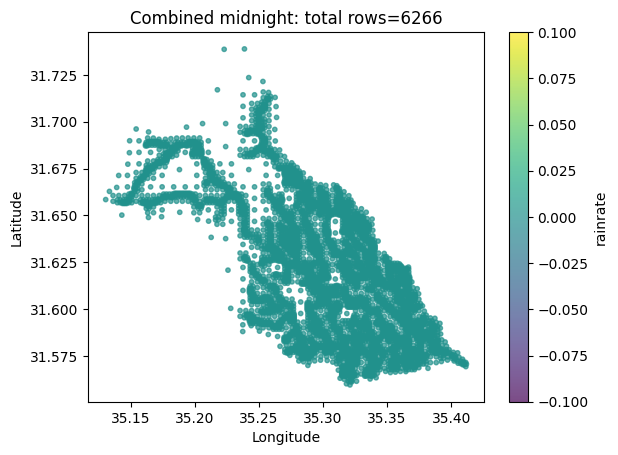

In [9]:
import pyarrow.parquet as pq
import pandas as pd
import matplotlib.pyplot as plt

def debug_midnight(parquet_file, time_col="time"):
    """
    Investigates rows that have time=='2012-01-01' vs. time=='2012-01-01 00:00:00'.
    Combines them to see if total is ~6000, prints shape, and plots them.
    Uses the top-level pq.read_table(..., filters=...) approach.
    """
    # 1) Rows with time='2012-01-01'
    table_date_only = pq.read_table(
        source=parquet_file,
        filters=[(time_col, '==', '2012-01-01')]
    )
    df_date_only = table_date_only.to_pandas()
    print(f"Rows for time='2012-01-01': {len(df_date_only)}")
    print("Sample rows (date-only):")
    print(df_date_only.head(5), "\n")

    # 2) Rows with time='2012-01-01 00:00:00'
    table_date_time = pq.read_table(
        source=parquet_file,
        filters=[(time_col, '==', '2012-01-01 00:00:00')]
    )
    df_date_time = table_date_time.to_pandas()
    print(f"Rows for time='2012-01-01 00:00:00': {len(df_date_time)}")
    print("Sample rows (date+time):")
    print(df_date_time.head(5), "\n")

    # 3) Combine them
    df_combined = pd.concat([df_date_only, df_date_time], ignore_index=True)
    combined_count = len(df_combined)
    print(f"Combined shape: {df_combined.shape} rows x {df_combined.shape[1]} columns")
    
    # 4) Scatter plot
    plt.figure()
    sc = plt.scatter(
        df_combined["longitude"],
        df_combined["latitude"],
        c=df_combined["rainrate"],
        s=10,
        alpha=0.7
    )
    plt.colorbar(sc, label="rainrate")
    plt.title(f"Combined midnight: total rows={combined_count}")
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.show()


# ================== USAGE EXAMPLE (SINGLE CELL) ==================
if __name__ == "__main__":
    parquet_file = (
        "/media/data-ssd/PINN/DATA/model data after proccessing/"
        "full POC model/3 final files according to spatial PINN Hebrew/"
        "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
        "darga_rain_2012_kriged_merged.parquet"
    )

    debug_midnight(parquet_file, time_col="time")


In [10]:
import os
import pandas as pd
import pyarrow as pa
import pyarrow.parquet as pq

def csv_to_parquet_chunked(
    csv_file,
    parquet_file,
    chunksize=2_000_000,
    compression="snappy"
):
    """
    Converts a large CSV to a single Parquet file in a chunked manner
    so we don't load the entire file into memory at once.

    :param csv_file: Path to the input CSV.
    :param parquet_file: Path to the output Parquet file.
    :param chunksize: Number of rows to read per chunk (tune based on your RAM).
    :param compression: Parquet compression codec ('snappy', 'gzip', None, etc.)
    """
    print("=== Converting CSV to Parquet ===")
    print(f"Source CSV: {csv_file}")
    print(f"Target Parquet: {parquet_file}")
    print(f"Chunksize: {chunksize}, compression: {compression}\n")

    total_rows = 0
    chunk_index = 0
    writer = None  # Will become a pyarrow.ParquetWriter once we read the first chunk

    # 1) Iterate over CSV in chunks
    for chunk_df in pd.read_csv(csv_file, chunksize=chunksize):
        chunk_index += 1
        rows_in_chunk = len(chunk_df)
        total_rows += rows_in_chunk
        
        # Convert pandas chunk to an Arrow Table
        table = pa.Table.from_pandas(chunk_df)

        # On the first chunk, open the ParquetWriter with the schema
        if writer is None:
            writer = pq.ParquetWriter(
                parquet_file,
                table.schema,
                compression=compression
            )
        
        # Write this chunk
        writer.write_table(table)
        
        print(f"  -> Chunk #{chunk_index}: {rows_in_chunk} rows, total so far: {total_rows}")
    
    # 2) Close Parquet writer if we wrote any chunks
    if writer is not None:
        writer.close()
        print(f"\nDone. Wrote {total_rows} total rows to {parquet_file}.")
    else:
        print("No data found in CSV (no chunks). No Parquet created.")

# ================= USAGE EXAMPLE (Single Cell) =================
if __name__ == "__main__":
    csv_input = (
        "/media/data-ssd/PINN/DATA/model data after proccessing/"
        "full POC model/3 final files according to spatial PINN Hebrew/"
        "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
        "expirient_parquet_etc/darga_rain_2013_kriged_merged.csv"
    )
    parquet_output = (
        "/media/data-ssd/PINN/DATA/model data after proccessing/"
        "full POC model/3 final files according to spatial PINN Hebrew/"
        "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
        "expirient_parquet_etc/darga_rain_2013_kriged_merged.parquet"
    )

    # Adjust chunksize if you have more or less RAM
    csv_to_parquet_chunked(
        csv_file=csv_input,
        parquet_file=parquet_output,
        chunksize=2_000_000,
        compression="snappy"
    )


=== Converting CSV to Parquet ===
Source CSV: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/darga_rain_2013_kriged_merged.csv
Target Parquet: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/darga_rain_2013_kriged_merged.parquet
Chunksize: 2000000, compression: snappy

  -> Chunk #1: 2000000 rows, total so far: 2000000
  -> Chunk #2: 2000000 rows, total so far: 4000000
  -> Chunk #3: 2000000 rows, total so far: 6000000
  -> Chunk #4: 2000000 rows, total so far: 8000000
  -> Chunk #5: 2000000 rows, total so far: 10000000
  -> Chunk #6: 2000000 rows, total so far: 12000000
  -> Chunk #7: 2000000 rows, total so far: 14000000
  -> Chunk #8: 2000000 rows, total so far: 16000000
  -> Chunk #9: 

=== Checking Parquet file: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/darga_rain_2013_kriged_merged.parquet ===

Row groups: 192
Total rows: 191227392

Columns (20): ['ID', 'time', 'rainrate', 'latitude', 'longitude', 'AREA_2M', 'STRM_ORDER', 'STREAM_CELL', 'DEM', 'SLOPE', 'ASPECT', 'TPI', 'TRI', 'TRIRILEY', 'TRIRMSD', 'ROUGHNESS', 'FLOWDIR', 'EQUATION', 'D50MM', 'manning_n']
Schema (partial):
ID: int64
time: string
rainrate: double
latitude: double
longitude: double
AREA_2M: int64
STRM_ORDER: int64
STREAM_CELL: int64
DEM: double
SLOPE: double
ASPECT: double
TPI: double
TRI: double
TRIRILEY: double
TRIRMSD: double
ROUGHNESS: double
FLOWDIR: double
EQUATION: string
D50MM: double
manning_n: double
-- schema metadata --
pandas: '{"index_columns": [{"kind": "range", "name": null, "start": 0, "' + 2531 

=== Reading row group #0 to show 

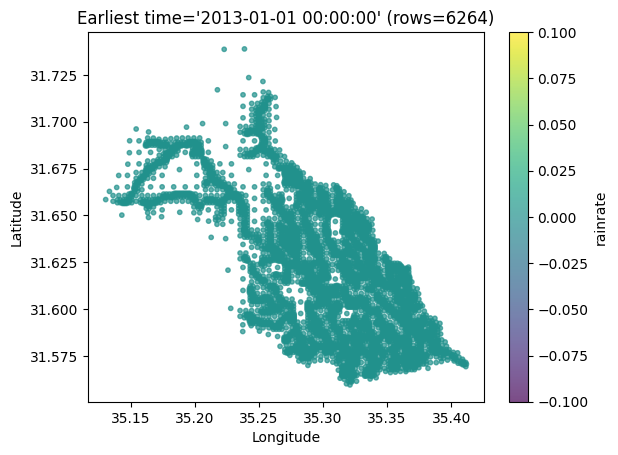

In [11]:
import pyarrow.parquet as pq
import pandas as pd
import matplotlib.pyplot as plt

def test_created_file(parquet_file, time_col='time'):
    """
    1) Prints metadata (# row groups, total rows, columns, partial schema).
    2) Shows the first 5 rows of row group #0.
    3) Finds the min timestamp in row group #0, reads all rows that match that timestamp,
       and scatter-plots them by (longitude, latitude), colored by 'rainrate'.
    """
    print(f"=== Checking Parquet file: {parquet_file} ===\n")
    
    # 1) Basic metadata
    pf = pq.ParquetFile(parquet_file)
    rg_count = pf.num_row_groups
    print(f"Row groups: {rg_count}")
    total_rows = sum(pf.metadata.row_group(i).num_rows for i in range(rg_count))
    print(f"Total rows: {total_rows}\n")

    # Schema and column names
    schema_arrow = pf.schema_arrow
    col_names = schema_arrow.names
    print(f"Columns ({len(col_names)}): {col_names}")
    print("Schema (partial):")
    print(schema_arrow, "\n")

    # 2) Row group #0 => first 5 rows
    print("=== Reading row group #0 to show the first 5 rows ===")
    table_0 = pf.read_row_group(0)  # read entire row group #0
    df_0 = table_0.to_pandas()
    print(df_0.head(5), "\n")

    # 3) Find earliest timestamp in row group #0
    #    (If your file isn't strictly sorted, the earliest in RG0 might not be the absolute earliest in the file.
    #     But often it's enough to see a sample scatter.)
    earliest_time = df_0[time_col].min()
    print(f"Earliest timestamp in row group #0: {earliest_time}")

    # Filter entire file for that time
    # If your pyarrow version supports filter pushdown with read_table, do:
    #   table_time = pf.read_table(filters=[(time_col, '==', earliest_time)])
    # Some older versions require the top-level function:
    from pyarrow.parquet import read_table
    table_time = read_table(
        source=parquet_file,
        filters=[(time_col, '==', earliest_time)]
    )
    df_time = table_time.to_pandas()
    print(f"Rows for earliest_time='{earliest_time}': {len(df_time)}\n")

    # Scatter plot
    if len(df_time) > 0 and all(c in df_time.columns for c in ["longitude", "latitude", "rainrate"]):
        plt.figure()
        sc = plt.scatter(
            df_time["longitude"],
            df_time["latitude"],
            c=df_time["rainrate"],
            s=10,
            alpha=0.7
        )
        plt.colorbar(sc, label="rainrate")
        plt.xlabel("Longitude")
        plt.ylabel("Latitude")
        plt.title(f"Earliest time='{earliest_time}' (rows={len(df_time)})")
        plt.show()
    else:
        print("No rows to scatter-plot or missing columns [longitude, latitude, rainrate].")

# ================== USAGE EXAMPLE (Single Cell) ==================
if __name__ == "__main__":
    parquet_file_2013 = (
        "/media/data-ssd/PINN/DATA/model data after proccessing/"
        "full POC model/3 final files according to spatial PINN Hebrew/"
        "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
        "expirient_parquet_etc/darga_rain_2013_kriged_merged.parquet"
    )

    test_created_file(parquet_file_2013, time_col="time")


Found 30528 distinct times.
Second-earliest timestamp: 2013-01-01 00:10:00
Time='2013-01-01 00:10:00' -> 6264 rows loaded.
Numeric features to plot: ['ID', 'rainrate', 'AREA_2M', 'STRM_ORDER', 'STREAM_CELL', 'DEM', 'SLOPE', 'ASPECT', 'TPI', 'TRI', 'TRIRILEY', 'TRIRMSD', 'ROUGHNESS', 'FLOWDIR', 'D50MM', 'manning_n']


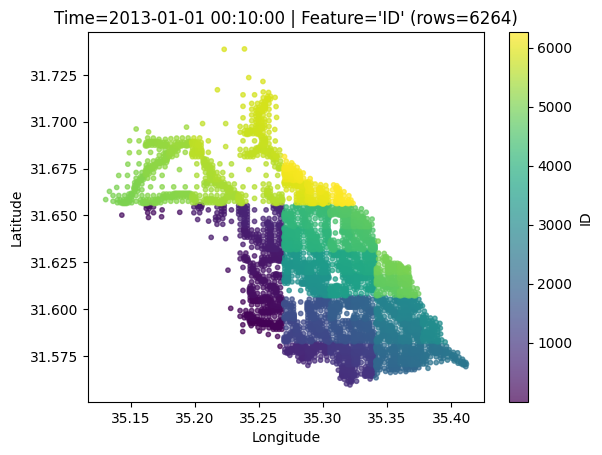

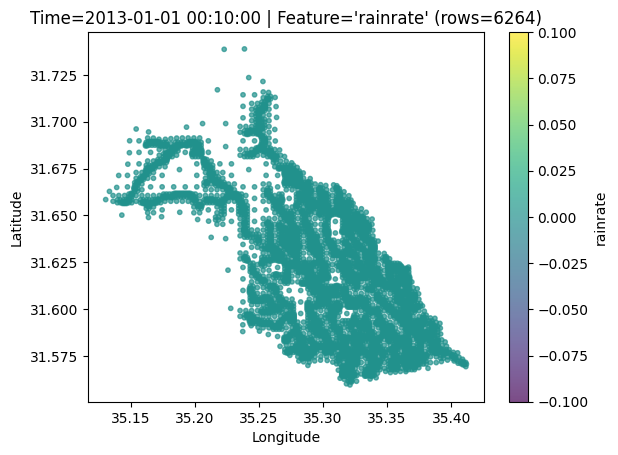

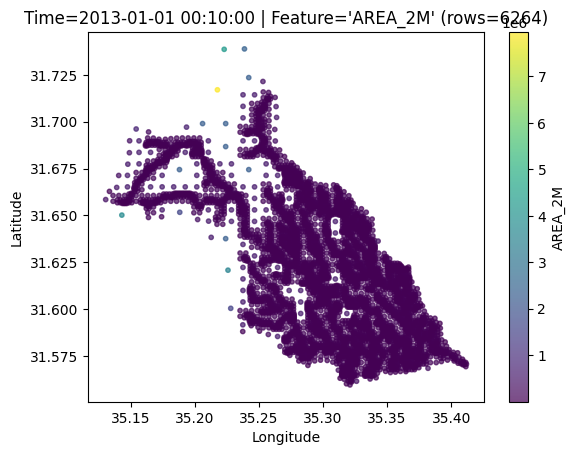

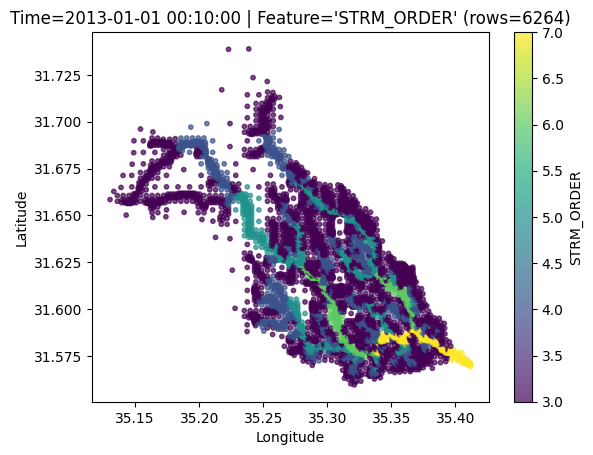

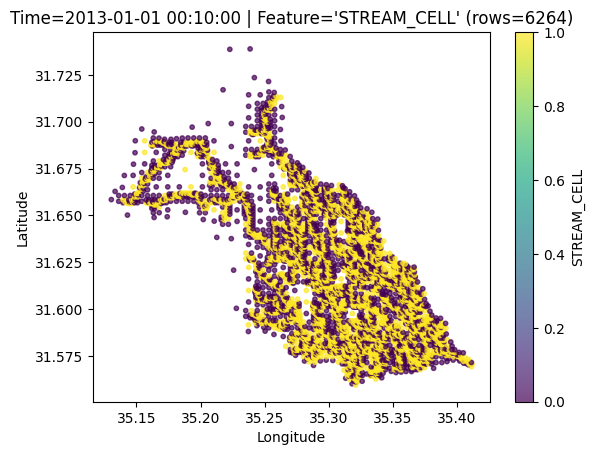

...

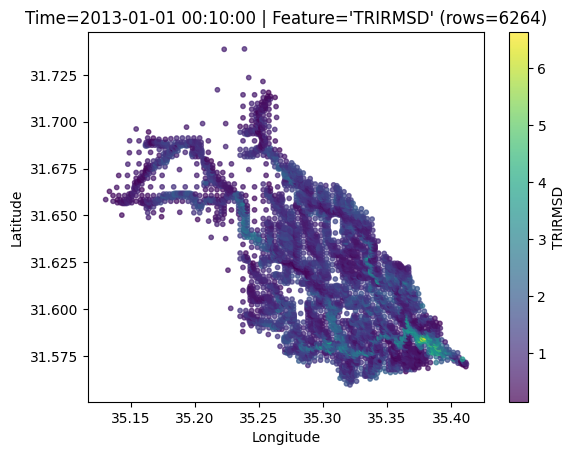

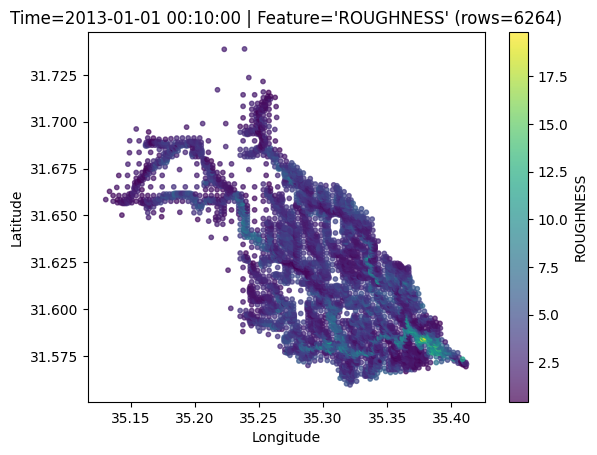

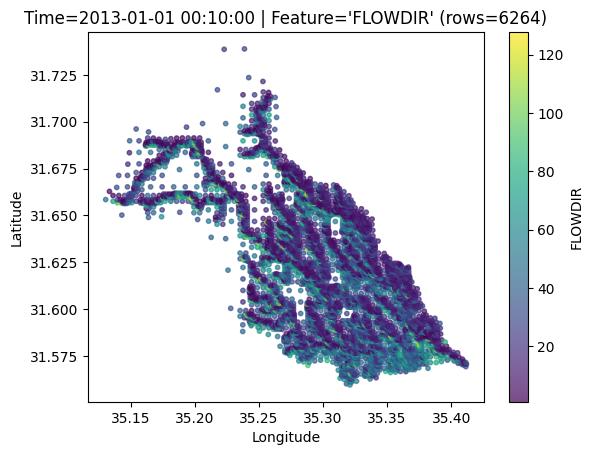

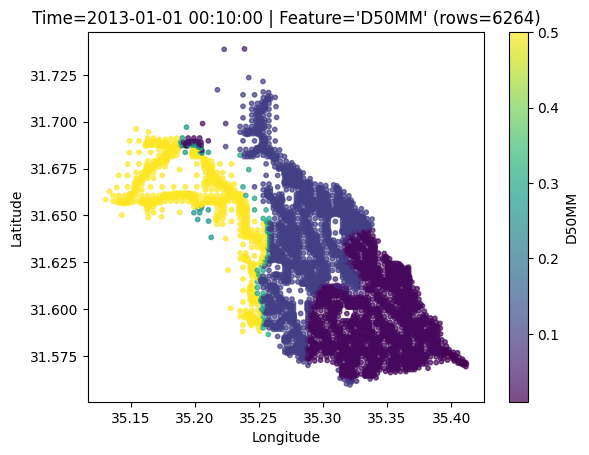

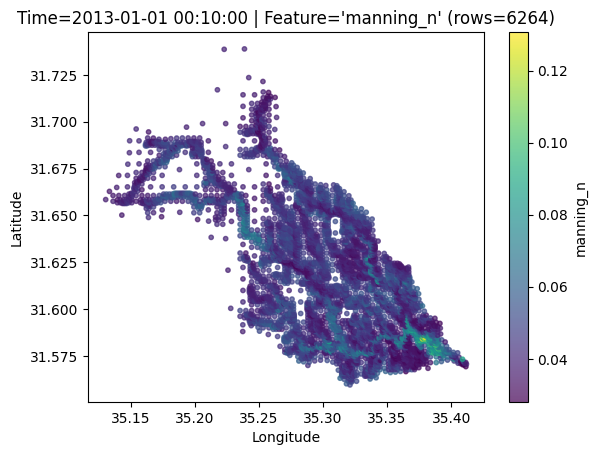

In [12]:
import pyarrow.parquet as pq
import pandas as pd
import matplotlib.pyplot as plt

def gather_all_times(parquet_file, time_col='time'):
    """
    Reads only the 'time' column from each row group, collecting all distinct times.
    Returns a sorted list (or Series) of unique timestamps/strings.
    
    WARNING: If you have extremely many distinct times (millions), 
    this might become large in memory. For 10-min steps, it's usually okay.
    """
    pf = pq.ParquetFile(parquet_file)
    all_times = []

    for rg_idx in range(pf.num_row_groups):
        table = pf.read_row_group(rg_idx, columns=[time_col])
        df_time = table.to_pandas()
        all_times.extend(df_time[time_col].tolist())

    s = pd.Series(all_times)
    # Sort as datetime if possible, otherwise lexicographic
    if pd.api.types.is_datetime64_any_dtype(s):
        s = s.drop_duplicates().sort_values()
    else:
        s = s.drop_duplicates().sort_values()
    s = s.reset_index(drop=True)
    return s

def plot_all_features_for_timestamp(parquet_file, time_value, lat_col='latitude', lon_col='longitude'):
    """
    Reads rows where time_col == time_value, then for each numeric feature
    (excluding lat/lon/time), does a scatter plot (lon vs lat) colored by that feature.
    """
    # Read filtered table
    table = pq.read_table(parquet_file, filters=[('time', '==', time_value)])
    df = table.to_pandas()
    
    print(f"Time='{time_value}' -> {len(df)} rows loaded.")
    if len(df) == 0:
        print("No rows at this time. Nothing to plot.")
        return
    
    # Identify numeric columns to plot, excluding lat/lon/time
    exclude_cols = {lat_col, lon_col, 'time'}
    numeric_features = []
    for col in df.columns:
        if col not in exclude_cols:
            # Check if numeric (float or int)
            if pd.api.types.is_numeric_dtype(df[col]):
                numeric_features.append(col)

    print("Numeric features to plot:", numeric_features)
    
    # Create one scatter plot per numeric feature
    for feature in numeric_features:
        plt.figure()
        sc = plt.scatter(
            df[lon_col],
            df[lat_col],
            c=df[feature],
            s=10,
            alpha=0.7
        )
        plt.colorbar(sc, label=feature)
        plt.title(f"Time={time_value} | Feature='{feature}' (rows={len(df)})")
        plt.xlabel("Longitude")
        plt.ylabel("Latitude")
        plt.show()


def scatter_second_time_frame_all_features(parquet_file, time_col='time'):
    """
    1) Gather all timestamps, pick the second earliest.
    2) Plot one scatter per numeric feature for that time frame.
    """
    all_times = gather_all_times(parquet_file, time_col=time_col)
    print(f"Found {len(all_times)} distinct times.")
    
    if len(all_times) < 2:
        print("No second time frame available (less than 2 distinct times).")
        return

    second_time = all_times.iloc[1]
    print(f"Second-earliest timestamp: {second_time}")

    plot_all_features_for_timestamp(parquet_file, second_time)


# =================== USAGE EXAMPLE (Single Cell) ===================
if __name__ == "__main__":
    parquet_file = (
        "/media/data-ssd/PINN/DATA/model data after proccessing/"
        "full POC model/3 final files according to spatial PINN Hebrew/"
        "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
        "expirient_parquet_etc/darga_rain_2013_kriged_merged.parquet"
    )

    scatter_second_time_frame_all_features(parquet_file, time_col="time")


In [13]:
%%time
import os
import glob
import pandas as pd
import pyarrow as pa
import pyarrow.parquet as pq

def csv_to_parquet_chunked(csv_file, parquet_file, chunksize=2_000_000, compression="snappy"):
    """
    Converts a large CSV to a single Parquet file in a chunked manner.
    :param csv_file: Path to the input CSV.
    :param parquet_file: Path to the output Parquet.
    :param chunksize: Number of rows to read per chunk (tune for your RAM).
    :param compression: Parquet compression codec ('snappy', 'gzip', etc.).
    """
    print(f"Converting:\n  CSV: {csv_file}\n  -> PARQUET: {parquet_file}\n")
    total_rows = 0
    chunk_count = 0
    writer = None

    for chunk_df in pd.read_csv(csv_file, chunksize=chunksize):
        chunk_count += 1
        rows_in_chunk = len(chunk_df)
        total_rows += rows_in_chunk
        
        table = pa.Table.from_pandas(chunk_df)
        if writer is None:
            writer = pq.ParquetWriter(
                parquet_file,
                table.schema,
                compression=compression
            )
        writer.write_table(table)
        print(f"  -> Chunk #{chunk_count}: read {rows_in_chunk} rows, total so far={total_rows}.")

    if writer is not None:
        writer.close()
        print(f"Done writing {total_rows} rows to {parquet_file}\n")
    else:
        print(f"No data found in {csv_file}; no Parquet file created.\n")


# =========== MAIN SCRIPT ===========

# 1) Folder containing the CSV files (2013, 2014, 2015, 2016, 2018, 2019, 2020, etc.).
source_csv_folder = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/"
    "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
)

# 2) Folder to store the resulting Parquet files
target_parquet_folder = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/"
    "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
    "expirient_parquet_etc/"
)

# Ensure the target folder exists
os.makedirs(target_parquet_folder, exist_ok=True)

# 3) Find all CSV files that match the pattern for your desired years
#    e.g.: 'darga_rain_*.csv' (excluding 2012 if you want).
pattern = os.path.join(source_csv_folder, "darga_rain_*.csv")
csv_files = glob.glob(pattern)

# Filter out any you don't want, e.g. 2012 if you'd prefer
# csv_files = [f for f in csv_files if "2012" not in f]

# 4) Iterate over each CSV and create a corresponding Parquet file
for csv_path in csv_files:
    # e.g. /path/darga_rain_2013_kriged_merged.csv -> darga_rain_2013_kriged_merged.parquet
    base_name = os.path.basename(csv_path)        # darga_rain_2013_kriged_merged.csv
    file_root, _ = os.path.splitext(base_name)    # darga_rain_2013_kriged_merged
    parquet_name = file_root + ".parquet"         # darga_rain_2013_kriged_merged.parquet
    
    parquet_path = os.path.join(target_parquet_folder, parquet_name)
    csv_to_parquet_chunked(
        csv_file=csv_path,
        parquet_file=parquet_path,
        chunksize=2_000_000,
        compression="snappy"
    )

print("All CSV files have been processed into Parquet.")


Converting:
  CSV: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/darga_rain_2015_kriged_merged.csv
  -> PARQUET: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/darga_rain_2015_kriged_merged.parquet

  -> Chunk #1: read 2000000 rows, total so far=2000000.
  -> Chunk #2: read 2000000 rows, total so far=4000000.
  -> Chunk #3: read 2000000 rows, total so far=6000000.
  -> Chunk #4: read 2000000 rows, total so far=8000000.
  -> Chunk #5: read 2000000 rows, total so far=10000000.
  -> Chunk #6: read 2000000 rows, total so far=12000000.
  -> Chunk #7: read 2000000 rows, total so far=14000000.
  -> Chunk #8: read 2000000 rows, total so far=16000000.
  -> Chunk #9: read 2000000 rows, total so far=18000000.
  -> Chun

Found 7 Parquet files to test:
 /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/darga_rain_2013_kriged_merged.parquet
 /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/darga_rain_2014_kriged_merged.parquet
 /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/darga_rain_2015_kriged_merged.parquet
 /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/darga_rain_2016_kriged_merged.parquet
 /media/data-ssd/

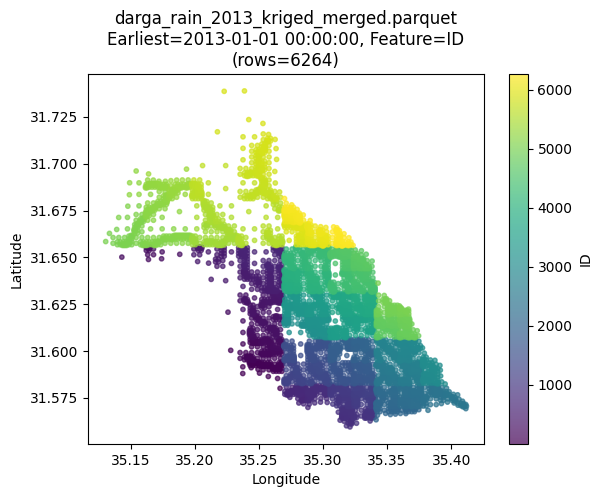

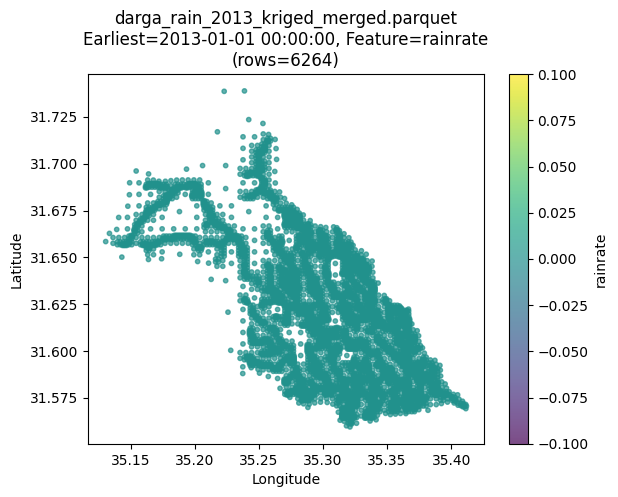

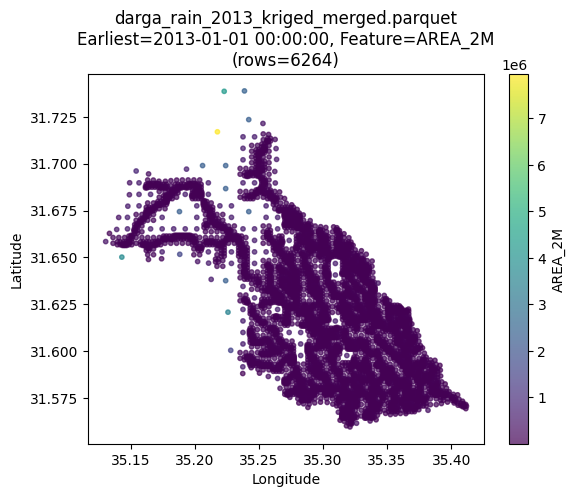

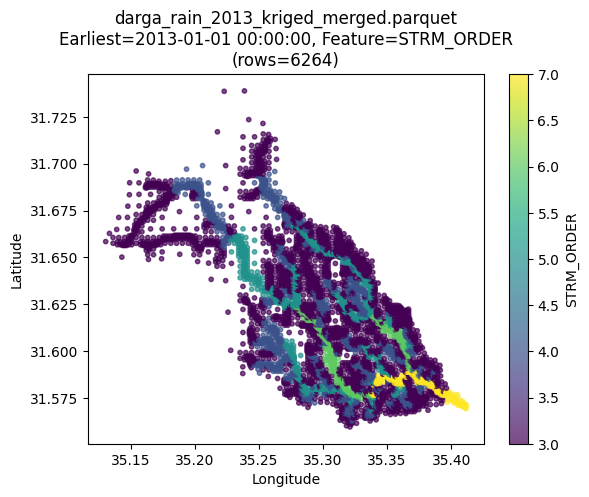

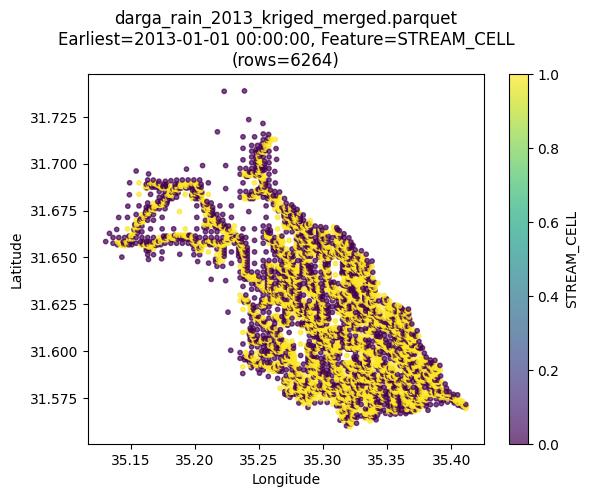

...

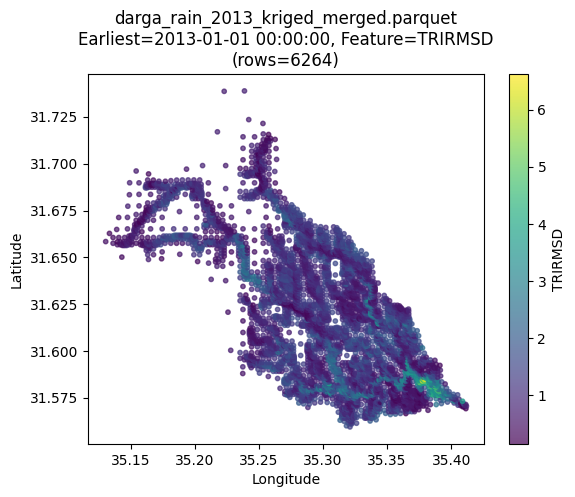

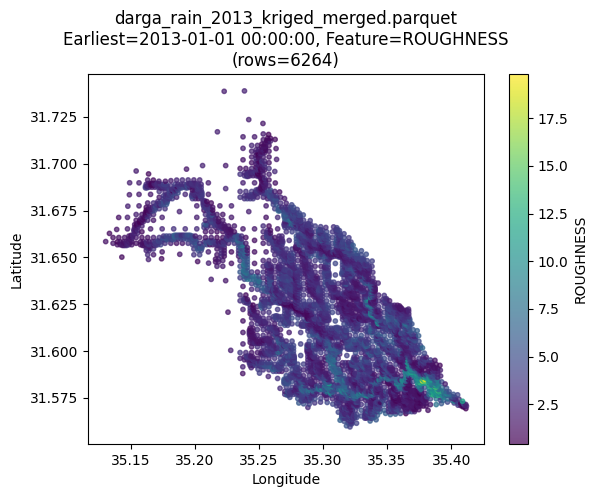

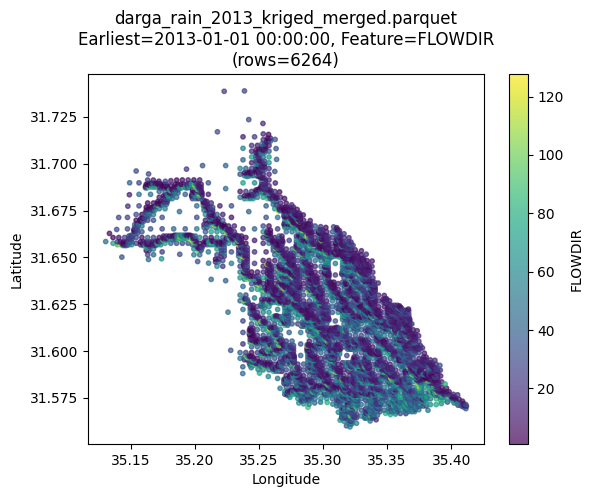

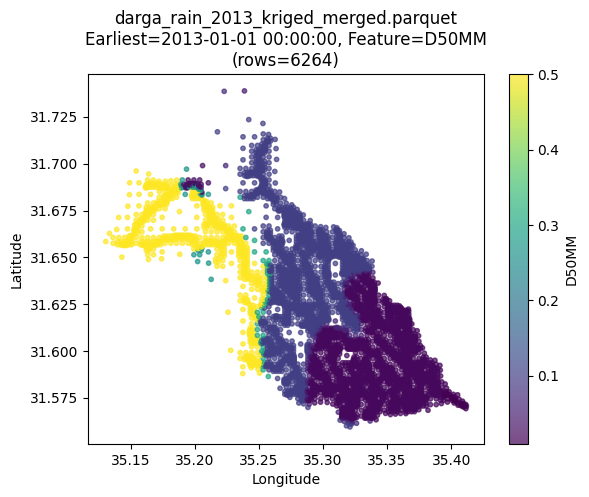

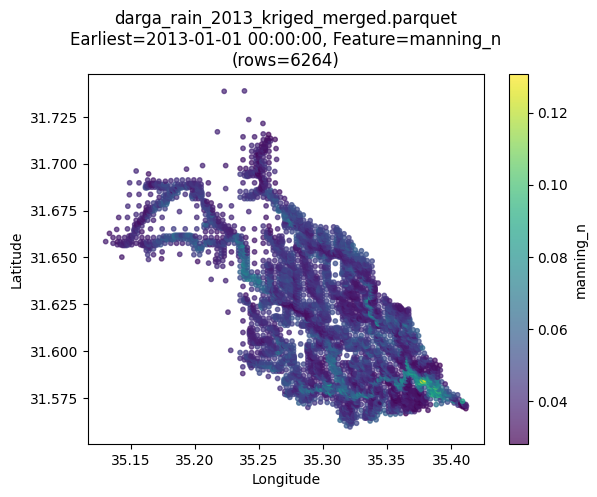


=== Analyzing Parquet file: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/darga_rain_2014_kriged_merged.parquet ===
Row groups: 192
Total rows (shape): 191227392 x 20 columns
Distinct time frames: 30528
Distinct spatial pixels (unique lat/lon pairs): 6264
Earliest time found in row group #0: 2014-01-01 00:00:00
Rows for earliest_time='2014-01-01 00:00:00': 6264
Plotting each numeric feature vs. lat/lon...


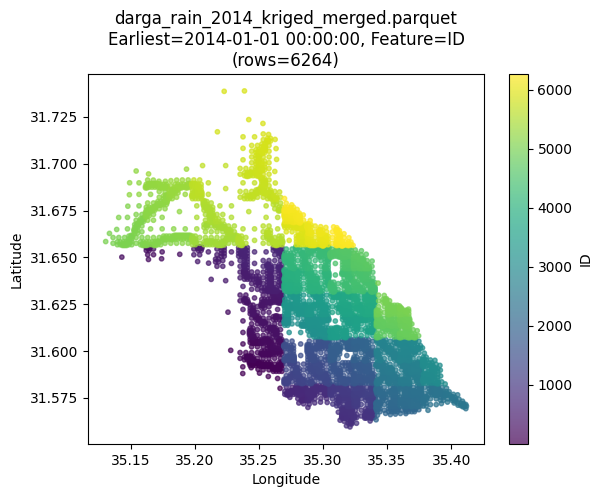

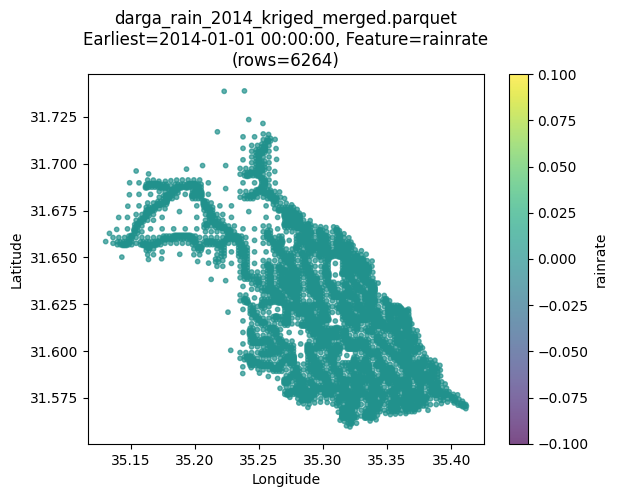

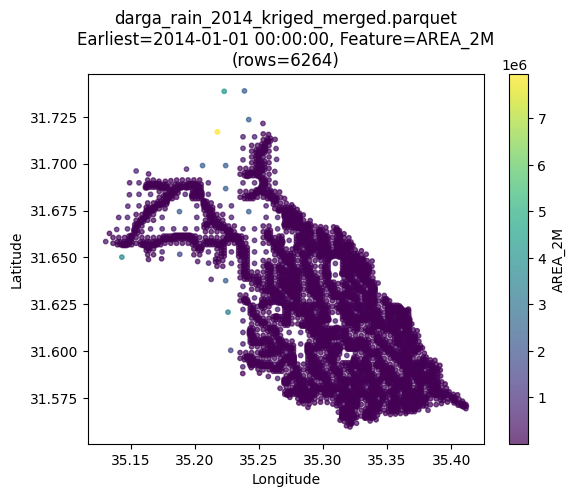

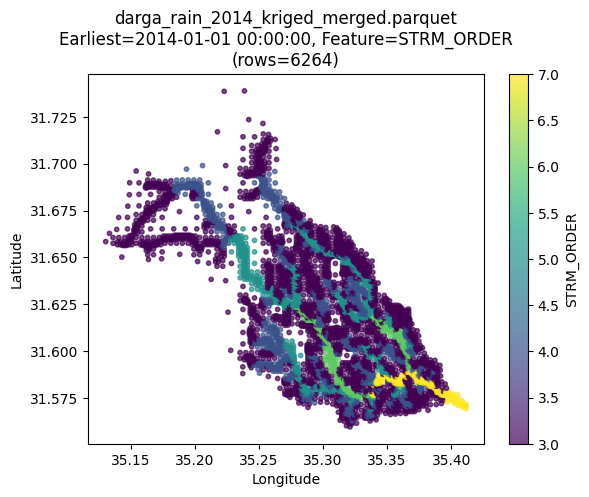

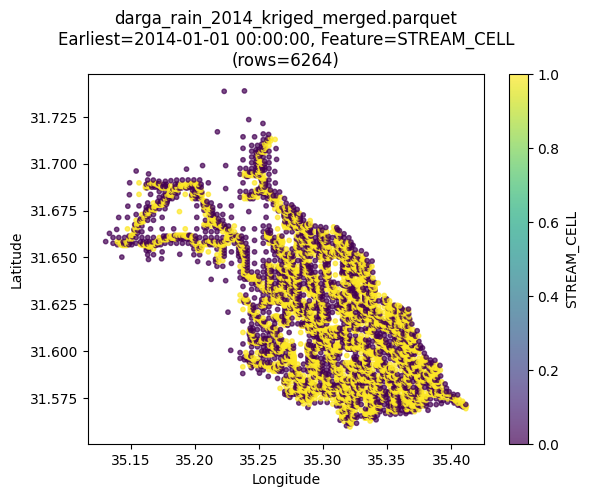

...

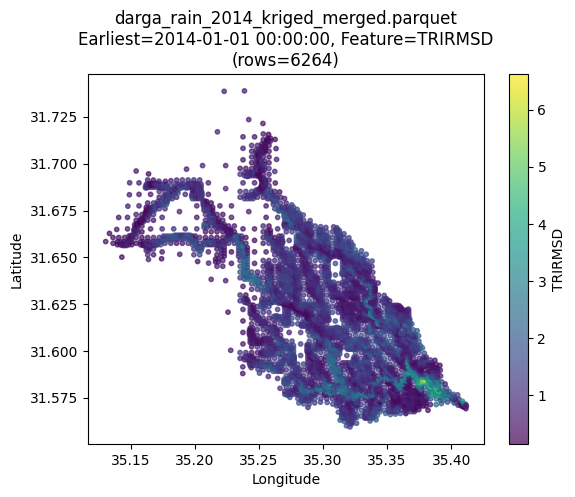

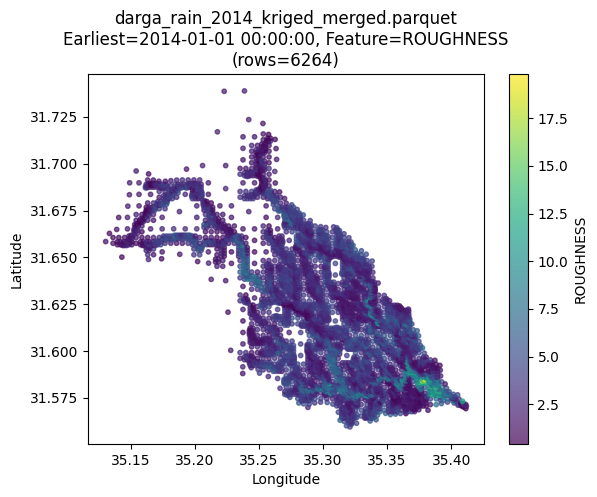

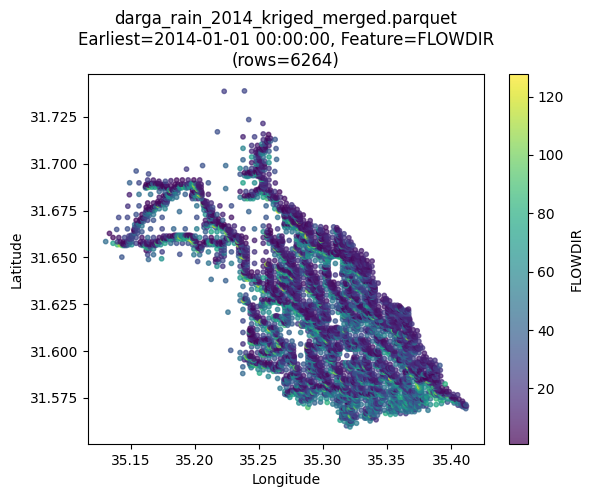

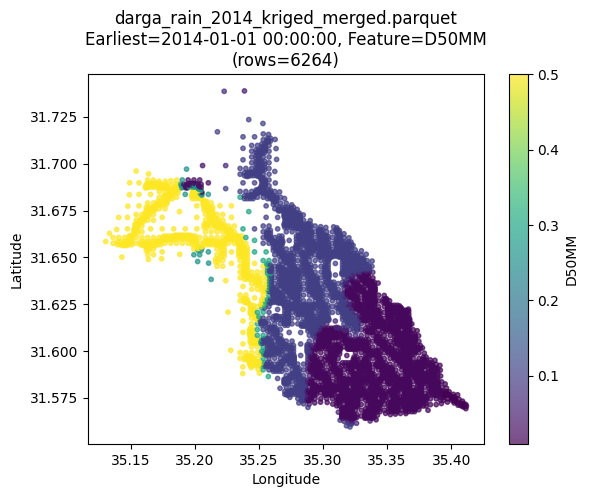

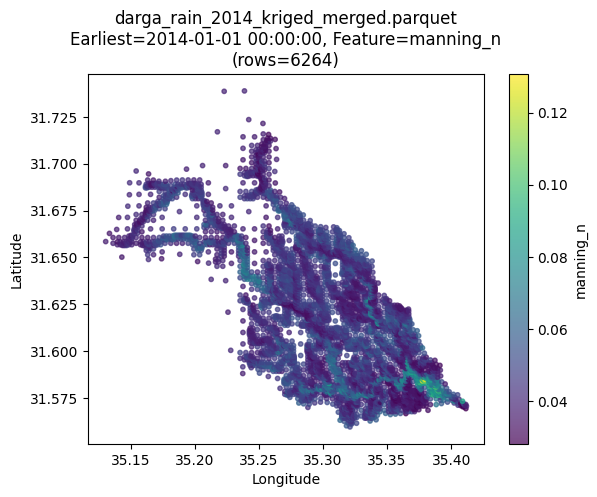


=== Analyzing Parquet file: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/darga_rain_2015_kriged_merged.parquet ===
Row groups: 192
Total rows (shape): 191227392 x 20 columns
Distinct time frames: 30528


KeyboardInterrupt: 

In [14]:
%%time
import os
import glob
import pandas as pd
import pyarrow as pa
import pyarrow.parquet as pq
import matplotlib.pyplot as plt

def summarize_parquet(parquet_file, time_col='time', lat_col='latitude', lon_col='longitude'):
    """
    Summarizes:
      - total rows (from row group metadata)
      - columns (names)
      - how many distinct time frames
      - how many distinct spatial pixels (lat+lon)
    Then loads the earliest time from row group #0, plots each numeric feature in a scatter plot.
    """
    print(f"=== Analyzing Parquet file: {parquet_file} ===")

    # 1) Basic shape info from metadata
    pf = pq.ParquetFile(parquet_file)
    rg_count = pf.num_row_groups
    total_rows = sum(pf.metadata.row_group(i).num_rows for i in range(rg_count))
    schema_arrow = pf.schema_arrow
    col_names = schema_arrow.names
    print(f"Row groups: {rg_count}")
    print(f"Total rows (shape): {total_rows} x {len(col_names)} columns")

    # 2) Distinct time frames
    #    We'll read only the time column in each row group to collect times
    distinct_times = set()
    for rg_idx in range(rg_count):
        tcol = pf.read_row_group(rg_idx, columns=[time_col]).to_pandas()
        distinct_times.update(tcol[time_col].tolist())
    print(f"Distinct time frames: {len(distinct_times)}")

    # 3) Distinct spatial pixels
    #    We'll read only lat/lon in each row group to collect unique pairs
    #    If you have tens of millions of rows, this might still be big in memory,
    #    so it's feasible for many but not all huge datasets. Alternatively, we might do a sample.
    distinct_pixels = set()
    for rg_idx in range(rg_count):
        tbl_coords = pf.read_row_group(rg_idx, columns=[lat_col, lon_col])
        df_coords = tbl_coords.to_pandas()
        for lt, ln in zip(df_coords[lat_col], df_coords[lon_col]):
            distinct_pixels.add((lt, ln))
    print(f"Distinct spatial pixels (unique lat/lon pairs): {len(distinct_pixels)}")

    # 4) Earliest time in row group #0
    #    This is not always the absolute earliest in the entire file, but it's a simple approach.
    #    If you want truly earliest across entire file, you'd gather times from all row groups,
    #    then pick the min. We'll keep it simpler here.
    tbl_rg0 = pf.read_row_group(0, columns=[time_col, lat_col, lon_col])
    df_rg0 = tbl_rg0.to_pandas()
    earliest_in_rg0 = df_rg0[time_col].min()
    print(f"Earliest time found in row group #0: {earliest_in_rg0}")

    # Now read all rows for that earliest time
    from pyarrow.parquet import read_table
    table_earliest = read_table(
        source=parquet_file,
        filters=[(time_col, '==', earliest_in_rg0)]
    )
    df_earliest = table_earliest.to_pandas()

    print(f"Rows for earliest_time='{earliest_in_rg0}': {len(df_earliest)}")

    # Identify numeric features (excluding time, lat, lon)
    exclude = {time_col, lat_col, lon_col}
    numeric_features = []
    for col in df_earliest.columns:
        if col not in exclude and pd.api.types.is_numeric_dtype(df_earliest[col]):
            numeric_features.append(col)

    print("Plotting each numeric feature vs. lat/lon...")

    # 5) For each numeric feature, scatter plot
    for feat in numeric_features:
        plt.figure()
        sc = plt.scatter(
            df_earliest[lon_col],
            df_earliest[lat_col],
            c=df_earliest[feat],
            s=10,
            alpha=0.7
        )
        plt.colorbar(sc, label=feat)
        plt.title(f"{os.path.basename(parquet_file)}\nEarliest={earliest_in_rg0}, Feature={feat}\n(rows={len(df_earliest)})")
        plt.xlabel("Longitude")
        plt.ylabel("Latitude")
        plt.show()

    print("="*60, "\n")


# ======================= MAIN SCRIPT =======================
if __name__ == "__main__":
    # Folder with your newly created Parquet files
    parquet_folder = (
        "/media/data-ssd/PINN/DATA/model data after proccessing/"
        "full POC model/3 final files according to spatial PINN Hebrew/"
        "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
        "expirient_parquet_etc/"
    )
    
    # We'll match all .parquet files named like darga_rain_*.parquet
    pattern = os.path.join(parquet_folder, "darga_rain_*.parquet")
    files = glob.glob(pattern)

    # If you want to exclude 2012 or 2013, just filter them out, e.g.:
    # files = [f for f in files if "2012" not in f]

    # Sort them so we see them in a tidy order
    files.sort()

    print(f"Found {len(files)} Parquet files to test:\n", "\n ".join(files), "\n")

    for pfile in files:
        summarize_parquet(pfile)
    
    print("All files processed.")


In [15]:
%%time
import os
import glob
import pandas as pd
import pyarrow as pa
import pyarrow.parquet as pq

def summarize_parquet_no_plot(
    parquet_file, 
    time_col='time', 
    lat_col='latitude', 
    lon_col='longitude'
):
    """
    Summarizes:
      - total rows (from row group metadata)
      - columns (names)
      - how many distinct time frames
      - how many distinct spatial pixels
      - earliest time found in row group #0 and how many rows match it
    No scatter plots are generated.
    """
    print(f"=== Analyzing Parquet file: {parquet_file} ===")

    # 1) Basic shape info from metadata
    pf = pq.ParquetFile(parquet_file)
    rg_count = pf.num_row_groups
    total_rows = sum(pf.metadata.row_group(i).num_rows for i in range(rg_count))
    schema_arrow = pf.schema_arrow
    col_names = schema_arrow.names

    print(f"Row groups: {rg_count}")
    print(f"Total rows: {total_rows}")
    print(f"Columns ({len(col_names)}): {col_names}")

    # 2) Distinct time frames
    distinct_times = set()
    for rg_idx in range(rg_count):
        tcol = pf.read_row_group(rg_idx, columns=[time_col]).to_pandas()
        distinct_times.update(tcol[time_col].tolist())
    print(f"Distinct time frames: {len(distinct_times)}")

    # 3) Distinct spatial pixels
    distinct_pixels = set()
    for rg_idx in range(rg_count):
        tbl_coords = pf.read_row_group(rg_idx, columns=[lat_col, lon_col])
        df_coords = tbl_coords.to_pandas()
        for lt, ln in zip(df_coords[lat_col], df_coords[lon_col]):
            distinct_pixels.add((lt, ln))
    print(f"Distinct spatial pixels (unique lat/lon pairs): {len(distinct_pixels)}")

    # 4) Earliest time in row group #0
    tbl_rg0 = pf.read_row_group(0, columns=[time_col, lat_col, lon_col])
    df_rg0 = tbl_rg0.to_pandas()
    earliest_in_rg0 = df_rg0[time_col].min()
    print(f"Earliest time found in row group #0: {earliest_in_rg0}")

    # 5) How many rows match that earliest time
    from pyarrow.parquet import read_table
    table_earliest = read_table(
        source=parquet_file,
        filters=[(time_col, '==', earliest_in_rg0)]
    )
    df_earliest = table_earliest.to_pandas()
    print(f"Rows for earliest_time='{earliest_in_rg0}': {len(df_earliest)}")

    print("=" * 60, "\n")


# ======================= MAIN SCRIPT =======================
if __name__ == "__main__":
    parquet_folder = (
        "/media/data-ssd/PINN/DATA/model data after proccessing/"
        "full POC model/3 final files according to spatial PINN Hebrew/"
        "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
        "expirient_parquet_etc/"
    )
    
    pattern = os.path.join(parquet_folder, "darga_rain_*.parquet")
    files = glob.glob(pattern)
    files.sort()

    print(f"Found {len(files)} Parquet files:\n")
    for pfile in files:
        summarize_parquet_no_plot(
            parquet_file=pfile, 
            time_col="time", 
            lat_col="latitude", 
            lon_col="longitude"
        )
    print("All files processed.")


Found 7 Parquet files:

=== Analyzing Parquet file: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/darga_rain_2013_kriged_merged.parquet ===
Row groups: 192
Total rows: 191227392
Columns (20): ['ID', 'time', 'rainrate', 'latitude', 'longitude', 'AREA_2M', 'STRM_ORDER', 'STREAM_CELL', 'DEM', 'SLOPE', 'ASPECT', 'TPI', 'TRI', 'TRIRILEY', 'TRIRMSD', 'ROUGHNESS', 'FLOWDIR', 'EQUATION', 'D50MM', 'manning_n']
Distinct time frames: 30528
Distinct spatial pixels (unique lat/lon pairs): 6264
Earliest time found in row group #0: 2013-01-01 00:00:00
Rows for earliest_time='2013-01-01 00:00:00': 6264

=== Analyzing Parquet file: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/darga_rain_2014_kriged_me

In [16]:
import pyarrow.parquet as pq

def show_head_2013(parquet_file, num_records=10):
    """
    Reads row group #0 from the Parquet file and prints
    the first 'num_records' rows (default=10).
    """
    pf = pq.ParquetFile(parquet_file)
    print(f"Number of row groups: {pf.num_row_groups}")
    
    # Read the first row group (often the earliest chunk if sorted by time)
    table = pf.read_row_group(0)
    df = table.to_pandas()
    
    print(f"=== First {num_records} rows of row group #0 ===")
    print(df.head(num_records))

if __name__ == "__main__":
    parquet_file_2013 = (
        "/media/data-ssd/PINN/DATA/model data after proccessing/"
        "full POC model/3 final files according to spatial PINN Hebrew/"
        "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
        "expirient_parquet_etc/darga_rain_2013_kriged_merged.parquet"
    )
    
    show_head_2013(parquet_file_2013, num_records=10)


Number of row groups: 192
=== First 10 rows of row group #0 ===
   ID                 time  rainrate   latitude  longitude  AREA_2M  \
0   1  2013-01-01 00:00:00       0.0  31.580134  35.266465   260847   
1   2  2013-01-01 00:00:00       0.0  31.600390  35.227964  1510689   
2   3  2013-01-01 00:00:00       0.0  31.588026  35.237338    39704   
3   4  2013-01-01 00:00:00       0.0  31.588228  35.250409     6199   
4   5  2013-01-01 00:00:00       0.0  31.591590  35.237395   565912   
5   6  2013-01-01 00:00:00       0.0  31.591137  35.243971    32241   
6   7  2013-01-01 00:00:00       0.0  31.590250  35.249273   102771   
7   8  2013-01-01 00:00:00       0.0  31.592284  35.243136    36378   
8   9  2013-01-01 00:00:00       0.0  31.592283  35.245388    36378   
9  10  2013-01-01 00:00:00       0.0  31.593435  35.242574     9095   

   STRM_ORDER  STREAM_CELL         DEM      SLOPE      ASPECT       TPI  \
0           3            1  509.220426  15.650532  132.073175  0.000826   
1   

In [2]:
import pandas as pd
import numpy as np
import os

# ------------------------------------------------------------------------------
# CONFIGURATION
# ------------------------------------------------------------------------------
# Folder holding the 7 Parquet rain files (note the 'expirient_parquet_etc' subfolder!)
rain_folder = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/"
    "kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc"
)

# Folder holding the 7 CSV discharge files
discharge_folder = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge"
)

# Output folder for the new merged files
output_folder = os.path.join(rain_folder, "with_discharge")
os.makedirs(output_folder, exist_ok=True)

# Years we want to process
years = [2013, 2014, 2015, 2016, 2018, 2019, 2020]

# Station (Darga) coordinates
station_lat = 31.60015
station_lon = 35.36552

# ------------------------------------------------------------------------------
# FUNCTION TO FIND NEAREST NEIGHBOR
# ------------------------------------------------------------------------------
def find_nearest_pixel(df, station_lat, station_lon):
    """
    Returns the index and (lat, lon) of the row in df that is closest to
    the station coordinates. Uses Euclidean distance in lat-lon space.
    """
    lat_diff = df['latitude'] - station_lat
    lon_diff = df['longitude'] - station_lon
    dist_sq = lat_diff**2 + lon_diff**2
    idx_min = dist_sq.idxmin()
    return idx_min, (df.at[idx_min, 'latitude'], df.at[idx_min, 'longitude'])

# ------------------------------------------------------------------------------
# MAIN LOOP
# ------------------------------------------------------------------------------
for year in years:
    print(f"\nProcessing year: {year} ...")

    # 1) Read the Parquet (rain) data
    rain_file = os.path.join(rain_folder, f"darga_rain_{year}_kriged_merged.parquet")
    df_rain = pd.read_parquet(rain_file)

    # 2) Read the discharge CSV data
    discharge_file = os.path.join(discharge_folder, f"darga_discharge_{year}.csv")
    df_discharge = pd.read_csv(discharge_file)

    # Ensure 'time' is a proper datetime in both
    df_rain['time'] = pd.to_datetime(df_rain['time'])
    df_discharge['date'] = pd.to_datetime(df_discharge['time'])

    # 3) Identify the single nearest neighbor pixel to the station
    idx_nearest, (nearest_lat, nearest_lon) = find_nearest_pixel(
        df_rain, station_lat, station_lon
    )
    print(f"  Nearest pixel found at lat={nearest_lat}, lon={nearest_lon}")
    lat_diff = abs(nearest_lat - station_lat)
    lon_diff = abs(nearest_lon - station_lon)
    print(f"  Difference from station: Δlat={lat_diff}, Δlon={lon_diff}")

    # 4) Merge the discharge values only for the nearest pixel
    df_rain['discharge'] = np.nan  # add the new column, all NaNs initially

    # Create a mask for the nearest pixel
    mask_nearest = (
        (df_rain['latitude'] == nearest_lat) &
        (df_rain['longitude'] == nearest_lon)
    )

    # Subset only the nearest pixel
    df_rain_nearest = df_rain[mask_nearest].copy()

    # Merge with discharge on 'time'
    df_rain_nearest = df_rain_nearest.merge(
        df_discharge[['time', 'discharge']],  # only needed columns
        on='time',
        how='left',
        suffixes=('', '_dis')
    )

    # If there's no existing 'discharge' column in df_rain, rename accordingly
    # We added df_rain['discharge'] = np.nan, so after merge we might have
    # df_rain_nearest['discharge_x'] and df_rain_nearest['discharge_y'] (or _dis).
    # Adjust as needed:
    if 'discharge_x' in df_rain_nearest.columns and 'discharge_y' in df_rain_nearest.columns:
        df_rain_nearest['discharge'] = df_rain_nearest['discharge_y']
        df_rain_nearest.drop(columns=['discharge_x', 'discharge_y'], inplace=True)

    # Place the merged discharge values back
    df_rain.loc[df_rain_nearest.index, 'discharge'] = df_rain_nearest['discharge']

    # ------------------------------------------------------------------------------
    # TEST / VALIDATION
    # ------------------------------------------------------------------------------
    # A) Confirm the row count hasn't changed
    print(f"  Final DataFrame shape: {df_rain.shape} (should match original).")

    # B) Count how many discharge values we actually set
    num_set = df_rain['discharge'].notnull().sum()
    common_times = set(df_rain['time']).intersection(set(df_discharge['time']))
    print(f"  Number of non-null discharges in final: {num_set}")
    print(f"  Number of common time steps in discharge CSV: {len(common_times)}")
    if num_set != len(common_times):
        print("  WARNING: Mismatch in expected number of discharge records!")
    else:
        print("  Merge test passed: correct number of discharge records inserted.")

    # (Optional) Additional sample check of a few times
    check_times = list(common_times)[:5]  # first 5
    for t in check_times:
        d_csv = df_discharge.loc[df_discharge['time'] == t, 'discharge'].values[0]
        d_rain = df_rain.loc[
            (df_rain['time'] == t) &
            (df_rain['latitude'] == nearest_lat) &
            (df_rain['longitude'] == nearest_lon),
            'discharge'
        ].values[0]
        if not np.isclose(d_csv, d_rain, equal_nan=True):
            print(f"  Mismatch at time {t}! {d_csv} vs {d_rain}")

    # 6) Save the result
    output_file = os.path.join(output_folder, f"darga_rain_{year}_kriged_merged_with_discharge.parquet")
    df_rain.to_parquet(output_file, index=False)
    print(f"  Saved merged file to: {output_file}")

print("\nDone processing all years.")



Processing year: 2013 ...


KeyError: 'time'

In [3]:
import pandas as pd
import numpy as np
import os

# ------------------------------------------------------------------------------
# CONFIGURATION
# ------------------------------------------------------------------------------
# Folder containing the 7 Parquet rain files
rain_folder = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/"
    "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc"
)

# Folder containing the 7 CSV discharge files
discharge_folder = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/"
    "dem slope UGRID/darga discharge"
)

# Output folder for merged Parquet files
output_folder = os.path.join(rain_folder, "with_discharge")
os.makedirs(output_folder, exist_ok=True)

# Years to process
years = [2013, 2014, 2015, 2016, 2018, 2019, 2020]

# Station (Darga) coordinates
station_lat = 31.60015
station_lon = 35.36552

# ------------------------------------------------------------------------------
# FUNCTION TO FIND NEAREST NEIGHBOR
# ------------------------------------------------------------------------------
def find_nearest_pixel(df, station_lat, station_lon):
    """
    Returns the index and (lat, lon) of the row in df that is closest to
    the station coordinates. Uses simple Euclidean distance in lat-lon space.
    """
    lat_diff = df['latitude'] - station_lat
    lon_diff = df['longitude'] - station_lon
    dist_sq = lat_diff**2 + lon_diff**2
    idx_min = dist_sq.idxmin()  # index of the nearest row
    return idx_min, (df.at[idx_min, 'latitude'], df.at[idx_min, 'longitude'])

# ------------------------------------------------------------------------------
# MAIN LOOP
# ------------------------------------------------------------------------------
for year in years:
    print(f"\nProcessing year: {year} ...")

    # 1) Read the Parquet (rain) data
    rain_file = os.path.join(rain_folder, f"darga_rain_{year}_kriged_merged.parquet")
    df_rain = pd.read_parquet(rain_file)

    # Convert 'time' to datetime
    df_rain['time'] = pd.to_datetime(df_rain['time'])

    # 2) Read the CSV (discharge) data
    discharge_file = os.path.join(discharge_folder, f"darga_discharge_{year}.csv")
    df_discharge = pd.read_csv(discharge_file)

    # The CSV has columns: date | rg_qms | latitude | longitude
    # Rename 'date' -> 'time' so we can merge on the same column name
    df_discharge.rename(columns={'date': 'time'}, inplace=True)
    
    # Convert 'time' to datetime
    df_discharge['time'] = pd.to_datetime(df_discharge['time'])

    # 3) Identify the single nearest neighbor pixel to the station
    idx_nearest, (nearest_lat, nearest_lon) = find_nearest_pixel(
        df_rain, station_lat, station_lon
    )
    print(f"  Nearest pixel found at lat={nearest_lat}, lon={nearest_lon}")
    print("  Distance from station: "
          f"Δlat={abs(nearest_lat - station_lat)}, "
          f"Δlon={abs(nearest_lon - station_lon)}")

    # 4) Create a new column for 'rg_qms' in df_rain, filled with NaN
    df_rain['rg_qms'] = np.nan

    # Create a mask for the nearest pixel
    mask_nearest = (
        (df_rain['latitude'] == nearest_lat) &
        (df_rain['longitude'] == nearest_lon)
    )

    # Subset only rows of the nearest pixel
    df_rain_nearest = df_rain[mask_nearest].copy()

    # Merge discharge (rg_qms) on 'time'
    df_rain_nearest = df_rain_nearest.merge(
        df_discharge[['time', 'rg_qms']],  # only the needed columns
        on='time',
        how='left',  # keep all times from df_rain_nearest
        suffixes=('', '_dis')
    )

    # If after merging we have both 'rg_qms_x' and 'rg_qms_y', unify them
    if 'rg_qms_x' in df_rain_nearest.columns and 'rg_qms_y' in df_rain_nearest.columns:
        # The newly merged discharge is in 'rg_qms_y'
        df_rain_nearest['rg_qms'] = df_rain_nearest['rg_qms_y']
        df_rain_nearest.drop(columns=['rg_qms_x', 'rg_qms_y'], inplace=True)

    # Place the merged discharge values back into df_rain
    df_rain.loc[df_rain_nearest.index, 'rg_qms'] = df_rain_nearest['rg_qms']

    # ------------------------------------------------------------------------------
    # VALIDATION
    # ------------------------------------------------------------------------------
    # Check row count
    print(f"  Final DataFrame shape: {df_rain.shape} (unchanged from the original).")

    # Count how many times have a non-null rg_qms
    num_set = df_rain['rg_qms'].notnull().sum()
    # Intersection of times in both data sets
    common_times = set(df_rain['time']).intersection(set(df_discharge['time']))
    print(f"  Number of non-null rg_qms in final: {num_set}")
    print(f"  Number of common time steps in discharge CSV: {len(common_times)}")

    if num_set != len(common_times):
        print("  WARNING: Mismatch in expected # of discharge (rg_qms) records!")
    else:
        print("  Merge test passed: correct number of discharge records inserted.")

    # Optional: quick check of the first few matching times
    check_times = list(common_times)[:5]
    for t in check_times:
        val_csv = df_discharge.loc[df_discharge['time'] == t, 'rg_qms'].values[0]
        val_rain = df_rain.loc[
            (df_rain['time'] == t) & 
            (df_rain['latitude'] == nearest_lat) & 
            (df_rain['longitude'] == nearest_lon), 
            'rg_qms'
        ].values[0]
        if not np.isclose(val_csv, val_rain, equal_nan=True):
            print(f"  Mismatch at time {t}: CSV={val_csv} vs. RAIN={val_rain}")

    # ------------------------------------------------------------------------------
    # SAVE
    # ------------------------------------------------------------------------------
    output_file = os.path.join(output_folder, f"darga_rain_{year}_kriged_merged_with_discharge.parquet")
    df_rain.to_parquet(output_file, index=False)
    print(f"  Saved merged file to: {output_file}")

print("\nDone processing all years.")



Processing year: 2013 ...
  Nearest pixel found at lat=31.6002474204079, lon=35.3653160916857
  Distance from station: Δlat=9.742040790072792e-05, Δlon=0.00020390831429750733
  Final DataFrame shape: (191227392, 21) (unchanged from the original).
  Number of non-null rg_qms in final: 0
  Number of common time steps in discharge CSV: 30528
  Mismatch at time 2013-01-22 10:00:00: CSV=0.0 vs. RAIN=nan
  Mismatch at time 2013-10-08 07:00:00: CSV=0.0 vs. RAIN=nan
  Mismatch at time 2013-02-11 07:20:00: CSV=0.0 vs. RAIN=nan
  Mismatch at time 2013-03-10 15:10:00: CSV=0.0 vs. RAIN=nan
  Mismatch at time 2013-10-09 11:00:00: CSV=0.0 vs. RAIN=nan
  Saved merged file to: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/with_discharge/darga_rain_2013_kriged_merged_with_discharge.parquet

Processing year: 2014 ...
  Nearest pixel found at lat=31.600

In [4]:
print("Rain earliest times:\n", df_rain['time'].sort_values().head(10))
print("Discharge earliest times:\n", df_discharge['time'].sort_values().head(10))


Rain earliest times:
 0      2020-01-01
4181   2020-01-01
4180   2020-01-01
4179   2020-01-01
4178   2020-01-01
4177   2020-01-01
4176   2020-01-01
4175   2020-01-01
4174   2020-01-01
4173   2020-01-01
Name: time, dtype: datetime64[ns]
Discharge earliest times:
 0   2020-01-01 00:00:00
1   2020-01-01 00:10:00
2   2020-01-01 00:20:00
3   2020-01-01 00:30:00
4   2020-01-01 00:40:00
5   2020-01-01 00:50:00
6   2020-01-01 01:00:00
7   2020-01-01 01:10:00
8   2020-01-01 01:20:00
9   2020-01-01 01:30:00
Name: time, dtype: datetime64[ns]


In [6]:
import pandas as pd

# Path to your 2020 Parquet file
rain_2020_file = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/"
    "full POC model/3 final files according to spatial PINN Hebrew/"
    "dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/"
    "expirient_parquet_etc/darga_rain_2020_kriged_merged.parquet"
)

# Read the 2020 rain data
df_rain_2020 = pd.read_parquet(rain_2020_file)

# Show the first 10 rows
print("=== First 10 rows of the 2020 Rain Parquet file ===")
print(df_rain_2020.head(10))


=== First 10 rows of the 2020 Rain Parquet file ===
   ID                 time  rainrate   latitude  longitude  AREA_2M  \
0   1  2020-01-01 00:00:00       0.0  31.580134  35.266465   260847   
1   2  2020-01-01 00:00:00       0.0  31.600390  35.227964  1510689   
2   3  2020-01-01 00:00:00       0.0  31.588026  35.237338    39704   
3   4  2020-01-01 00:00:00       0.0  31.588228  35.250409     6199   
4   5  2020-01-01 00:00:00       0.0  31.591590  35.237395   565912   
5   6  2020-01-01 00:00:00       0.0  31.591137  35.243971    32241   
6   7  2020-01-01 00:00:00       0.0  31.590250  35.249273   102771   
7   8  2020-01-01 00:00:00       0.0  31.592284  35.243136    36378   
8   9  2020-01-01 00:00:00       0.0  31.592283  35.245388    36378   
9  10  2020-01-01 00:00:00       0.0  31.593435  35.242574     9095   

   STRM_ORDER  STREAM_CELL         DEM      SLOPE      ASPECT       TPI  \
0           3            1  509.220426  15.650532  132.073175  0.000826   
1           3   

In [7]:
import pandas as pd
import numpy as np
import os

# -----------------------------------------------------------------------------------
# SINGLE-CELL SCRIPT:
# Merge discharge (rg_qms) into the rain data for each of the 7 years
# (2013, 2014, 2015, 2016, 2018, 2019, 2020) while preserving the minute/second in 'time'.
# We do not floor or round the timestamps, so exact matches are required.
# -----------------------------------------------------------------------------------

# Paths for the rain and discharge data
rain_base_folder = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/"
    "kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc"
)

discharge_base_folder = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge"
)

# Output folder
output_folder = os.path.join(rain_base_folder, "with_discharge")
os.makedirs(output_folder, exist_ok=True)

# Years to process
years = [2013, 2014, 2015, 2016, 2018, 2019, 2020]

# Station (Darga) coordinates
station_lat = 31.60015
station_lon = 35.36552

def find_nearest_pixel(df, s_lat, s_lon):
    """
    Return (index, (latitude, longitude)) of the pixel closest
    to (s_lat, s_lon) using Euclidean distance in lat-lon space.
    """
    lat_diff = df["latitude"] - s_lat
    lon_diff = df["longitude"] - s_lon
    dist_sq = lat_diff**2 + lon_diff**2
    idx_min = dist_sq.idxmin()
    return idx_min, (df.at[idx_min, "latitude"], df.at[idx_min, "longitude"])

# -----------------------------------------------------------------------------------
# MAIN LOOP
# -----------------------------------------------------------------------------------
for year in years:
    print(f"\n=== Processing year {year} ===")

    # 1) Read the Parquet rain data
    rain_file = os.path.join(rain_base_folder, f"darga_rain_{year}_kriged_merged.parquet")
    df_rain = pd.read_parquet(rain_file)

    # Ensure 'time' is a datetime and preserve minutes/seconds
    df_rain["time"] = pd.to_datetime(df_rain["time"])

    # 2) Read the discharge CSV
    discharge_file = os.path.join(discharge_base_folder, f"darga_discharge_{year}.csv")
    df_discharge = pd.read_csv(discharge_file)

    # Rename 'date' -> 'time' so both DataFrames have the same column name
    df_discharge.rename(columns={"date": "time"}, inplace=True)
    df_discharge["time"] = pd.to_datetime(df_discharge["time"])

    # 3) Find the nearest pixel in the rain data
    idx_nearest, (nearest_lat, nearest_lon) = find_nearest_pixel(df_rain, station_lat, station_lon)
    print(f"  Nearest pixel: lat={nearest_lat:.6f}, lon={nearest_lon:.6f}")

    # 4) Create 'rg_qms' column in the rain DataFrame
    df_rain["rg_qms"] = np.nan

    # Mask for that nearest pixel
    mask_nearest = (
        (df_rain["latitude"] == nearest_lat) &
        (df_rain["longitude"] == nearest_lon)
    )
    df_nearest = df_rain[mask_nearest].copy()

    # 5) Merge discharge on 'time' (exact match, no rounding/flooring)
    df_nearest = df_nearest.merge(
        df_discharge[["time", "rg_qms"]],
        on="time",
        how="left",
        suffixes=("", "_dis")
    )

    # If we have rg_qms_x, rg_qms_y, unify them
    if "rg_qms_x" in df_nearest.columns and "rg_qms_y" in df_nearest.columns:
        df_nearest["rg_qms"] = df_nearest["rg_qms_y"]
        df_nearest.drop(columns=["rg_qms_x", "rg_qms_y"], inplace=True)

    # Put merged discharge back into the main df_rain
    df_rain.loc[df_nearest.index, "rg_qms"] = df_nearest["rg_qms"]

    # 6) Save
    out_file = os.path.join(output_folder, f"darga_rain_{year}_kriged_merged_with_discharge.parquet")
    df_rain.to_parquet(out_file, index=False)

    # 7) Quick check
    n_common = len(set(df_discharge["time"]).intersection(set(df_rain["time"])))
    n_merged = df_rain["rg_qms"].notnull().sum()
    print(f"  Common times in both: {n_common}")
    print(f"  Non-null merges in final df: {n_merged}")
    if n_merged != n_common:
        print("  WARNING: Some timestamps did not merge (may be tz or fractional mismatch).")
    else:
        print("  Timestamps successfully merged (exact match).")

print("\nAll years processed. Merged Parquet files are in:", output_folder)



=== Processing year 2013 ===
  Nearest pixel: lat=31.600247, lon=35.365316
  Common times in both: 30528
  Non-null merges in final df: 0

=== Processing year 2014 ===
  Nearest pixel: lat=31.600247, lon=35.365316
  Common times in both: 30528
  Non-null merges in final df: 0

=== Processing year 2015 ===
  Nearest pixel: lat=31.600247, lon=35.365316
  Common times in both: 30528
  Non-null merges in final df: 0

=== Processing year 2016 ===
  Nearest pixel: lat=31.600247, lon=35.365316
  Common times in both: 30672
  Non-null merges in final df: 0

=== Processing year 2018 ===
  Nearest pixel: lat=31.600247, lon=35.365316
  Common times in both: 30528
  Non-null merges in final df: 0

=== Processing year 2019 ===
  Nearest pixel: lat=31.600247, lon=35.365316
  Common times in both: 30528
  Non-null merges in final df: 0

=== Processing year 2020 ===
  Nearest pixel: lat=31.600247, lon=35.365316
  Common times in both: 30672
  Non-null merges in final df: 0

All years processed. Merge

In [8]:
import pandas as pd

# Path to your merged 2013 Parquet file
merged_2013_file = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/"
    "kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/"
    "with_discharge/darga_rain_2013_kriged_merged_with_discharge.parquet"
)

# Read the merged Parquet
df_2013_merged = pd.read_parquet(merged_2013_file)

# Print the first 10 rows
print("=== Head (10 rows) of the merged 2013 file ===")
print(df_2013_merged.head(10))


=== Head (10 rows) of the merged 2013 file ===
   ID       time  rainrate   latitude  longitude  AREA_2M  STRM_ORDER  \
0   1 2013-01-01       0.0  31.580134  35.266465   260847           3   
1   2 2013-01-01       0.0  31.600390  35.227964  1510689           3   
2   3 2013-01-01       0.0  31.588026  35.237338    39704           3   
3   4 2013-01-01       0.0  31.588228  35.250409     6199           4   
4   5 2013-01-01       0.0  31.591590  35.237395   565912           3   
5   6 2013-01-01       0.0  31.591137  35.243971    32241           3   
6   7 2013-01-01       0.0  31.590250  35.249273   102771           4   
7   8 2013-01-01       0.0  31.592284  35.243136    36378           3   
8   9 2013-01-01       0.0  31.592283  35.245388    36378           4   
9  10 2013-01-01       0.0  31.593435  35.242574     9095           3   

   STREAM_CELL         DEM      SLOPE  ...       TPI       TRI  TRIRILEY  \
0            1  509.220426  15.650532  ...  0.000826  0.881682  2.838051 

In [2]:
import pandas as pd

merged_2013_file = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/"
    "kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/"
    "with_discharge/darga_rain_2013_kriged_merged_with_discharge.parquet"
)

df_2013_merged = pd.read_parquet(merged_2013_file)

# Check the first 6264 rows for non-null discharge
first_6264_discharge = df_2013_merged.head(10000)['rg_qms']
non_null_count = first_6264_discharge.notnull().sum()

if non_null_count > 0:
    print(f"Within the first 6264 rows, there are {non_null_count} non-NaN rg_qms values.")
else:
    print("All first 6264 rows have NaN in rg_qms.")


All first 6264 rows have NaN in rg_qms.


In [3]:
import pandas as pd

# Path to the Parquet file for (say) 2013, or any year you're checking
rain_file_2013 = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/"
    "kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/"
    "darga_rain_2013_kriged_merged.parquet"
)

# Known nearest pixel coordinates
pixel_lat = 31.6002474204079
pixel_lon = 35.3653160916857

df_rain_2013 = pd.read_parquet(rain_file_2013)
df_rain_2013["time"] = pd.to_datetime(df_rain_2013["time"])

# Inspect the first 6264 rows
subset_6264 = df_rain_2013.head(6264)

# Check how many rows match the given coordinates
mask = (
    (subset_6264["latitude"] == pixel_lat) &
    (subset_6264["longitude"] == pixel_lon)
)
num_matches = mask.sum()

if num_matches > 0:
    print(f"Found the pixel (lat={pixel_lat}, lon={pixel_lon}) {num_matches} time(s) within the first 6264 rows.")
else:
    print(f"Pixel (lat={pixel_lat}, lon={pixel_lon}) does NOT appear in the first 6264 rows.")


Found the pixel (lat=31.6002474204079, lon=35.3653160916857) 1 time(s) within the first 6264 rows.


In [ ]:
import pandas as pd
import numpy as np
import os

# -------------------------------------------------------------------------------------
# MERGE DISCHARGE (rg_qms) INTO THE SINGLE NEAREST-NEIGHBOR PIXEL
# FOR EACH YEAR (2013, 2014, 2015, 2016, 2018, 2019, 2020).
#
# We ALREADY know the nearest pixel's coordinates. Hence, we skip any "finding" logic
# and directly use those lat/lon for the pixel that should receive non-NaN values.
#
# Make sure both DataFrames have the same date/time column name ('time'), and preserve
# minutes/seconds (no rounding/flooring).
# -------------------------------------------------------------------------------------

# 1) Paths and configuration
rain_base_folder = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/"
    "kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc"
)

discharge_base_folder = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge"
)

output_folder = os.path.join(rain_base_folder, "with_discharge")
os.makedirs(output_folder, exist_ok=True)

years = [2013, 2014, 2015, 2016, 2018, 2019, 2020]

# 2) KNOWN NEAREST PIXEL COORDINATES
pixel_lat = 31.6002474204079
pixel_lon = 35.3653160916857

# 3) Process each year
for year in years:
    print(f"\n=== Processing year {year} ===")

    # (a) Read the Parquet rain data
    rain_file = os.path.join(rain_base_folder, f"darga_rain_{year}_kriged_merged.parquet")
    df_rain = pd.read_parquet(rain_file)
    df_rain['time'] = pd.to_datetime(df_rain['time'])

    # (b) Read the discharge CSV, rename 'date' -> 'time', parse to datetime
    discharge_file = os.path.join(discharge_base_folder, f"darga_discharge_{year}.csv")
    df_discharge = pd.read_csv(discharge_file)
    df_discharge.rename(columns={'date': 'time'}, inplace=True)
    df_discharge['time'] = pd.to_datetime(df_discharge['time'])

    # (c) Create/initialize 'rg_qms' column in the rain DataFrame
    df_rain['rg_qms'] = np.nan

    # (d) Subset the single known nearest pixel
    mask_pixel = (
        (df_rain['latitude'] == pixel_lat) &
        (df_rain['longitude'] == pixel_lon)
    )
    df_pixel = df_rain[mask_pixel].copy()

    # (e) Merge discharge for that single pixel (on 'time')
    df_pixel = df_pixel.merge(
        df_discharge[['time', 'rg_qms']],
        on='time',
        how='left',
        suffixes=('', '_dis')
    )

    # If we ended up with rg_qms_x, rg_qms_y, unify them
    if 'rg_qms_x' in df_pixel.columns and 'rg_qms_y' in df_pixel.columns:
        df_pixel['rg_qms'] = df_pixel['rg_qms_y']
        df_pixel.drop(columns=['rg_qms_x', 'rg_qms_y'], inplace=True)

    # (f) Assign the merged discharge values back into df_rain
    df_rain.loc[df_pixel.index, 'rg_qms'] = df_pixel['rg_qms']

    # (g) Save the merged result
    out_file = os.path.join(
        output_folder,
        f"darga_rain_{year}_kriged_merged_with_discharge.parquet"
    )
    df_rain.to_parquet(out_file, index=False)

    # (h) Log a quick summary
    n_common = len(set(df_discharge['time']).intersection(set(df_rain['time'])))
    n_merged = df_rain['rg_qms'].notnull().sum()
    print(f"  Common timestamps in discharge & rain: {n_common}")
    print(f"  Non-null rg_qms in final df: {n_merged}")

print("\nDONE. Merged files are in:", output_folder)



=== Processing year 2013 ===
  Common timestamps in discharge & rain: 30528
  Non-null rg_qms in final df: 0

=== Processing year 2014 ===


In [1]:
import pandas as pd

merged_2013_file = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/"
    "kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/"
    "with_discharge/darga_rain_2013_kriged_merged_with_discharge.parquet"
)

# Only load the columns we care about to save memory
cols_to_load = ["time", "latitude", "longitude", "rg_qms"]
df_2013_merged_minimal = pd.read_parquet(merged_2013_file, columns=cols_to_load)

# The known "nearest" pixel coords
pixel_lat = 31.6002474204079
pixel_lon = 35.3653160916857

# Filter to that single pixel
df_2013_pixel = df_2013_merged_minimal[
    (df_2013_merged_minimal["latitude"] == pixel_lat) &
    (df_2013_merged_minimal["longitude"] == pixel_lon)
].copy()

print("=== Nearest Pixel Rows in 2013 Merged Parquet ===")
print(df_2013_pixel.head(15))  # Just show first 15 rows

# How many total rows does this pixel have?
total_pixel_rows = df_2013_pixel.shape[0]
non_null_qms = df_2013_pixel["rg_qms"].notnull().sum()

print(f"\nPixel lat={pixel_lat}, lon={pixel_lon}:")
print(f"  Total rows = {total_pixel_rows}")
print(f"  Non-null rg_qms = {non_null_qms}")


=== Nearest Pixel Rows in 2013 Merged Parquet ===
                     time   latitude  longitude  rg_qms
2876  2013-01-01 00:00:00  31.600247  35.365316     NaN
9140  2013-01-01 00:10:00  31.600247  35.365316     NaN
15404 2013-01-01 00:20:00  31.600247  35.365316     NaN
21668 2013-01-01 00:30:00  31.600247  35.365316     NaN
27932 2013-01-01 00:40:00  31.600247  35.365316     NaN
34196 2013-01-01 00:50:00  31.600247  35.365316     NaN
40460 2013-01-01 01:00:00  31.600247  35.365316     NaN
46724 2013-01-01 01:10:00  31.600247  35.365316     NaN
52988 2013-01-01 01:20:00  31.600247  35.365316     NaN
59252 2013-01-01 01:30:00  31.600247  35.365316     NaN
65516 2013-01-01 01:40:00  31.600247  35.365316     NaN
71780 2013-01-01 01:50:00  31.600247  35.365316     NaN
78044 2013-01-01 02:00:00  31.600247  35.365316     NaN
84308 2013-01-01 02:10:00  31.600247  35.365316     NaN
90572 2013-01-01 02:20:00  31.600247  35.365316     NaN

Pixel lat=31.6002474204079, lon=35.3653160916857:
  T

In [2]:
import pandas as pd

# Paths to 2013 rain and discharge files
rain_file_2013 = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/"
    "kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/"
    "darga_rain_2013_kriged_merged.parquet"
)

discharge_file_2013 = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/"
    "darga discharge/darga_discharge_2013.csv"
)

# 1) Read the rain data
df_rain_2013 = pd.read_parquet(rain_file_2013)
df_rain_2013["time"] = pd.to_datetime(df_rain_2013["time"])

# 2) Extract first 6264 rows (the first time step across all pixels)
subset_6264 = df_rain_2013.head(6264)
first_rain_time = subset_6264.iloc[0]["time"]  # the "time" in the very first row

# 3) Read the discharge data
df_discharge_2013 = pd.read_csv(discharge_file_2013)
df_discharge_2013.rename(columns={"date": "time"}, inplace=True)
df_discharge_2013["time"] = pd.to_datetime(df_discharge_2013["time"])

# 4) Take the first time from the discharge
first_discharge_time = df_discharge_2013.iloc[0]["time"]

# 5) Print them and see if they match
print("First rain (subset of 6264) timestamp:", repr(first_rain_time))
print("First discharge timestamp:", repr(first_discharge_time))

match_exact = (first_rain_time == first_discharge_time)
print(f"\nDo these timestamps match exactly? {match_exact}")

# If they differ, print the difference (in Timedelta form)
if not match_exact:
    time_diff = first_rain_time - first_discharge_time
    print("Difference between them:", time_diff)
else:
    print("They are perfectly equal (including microseconds and tz).")


First rain (subset of 6264) timestamp: Timestamp('2013-01-01 00:00:00')
First discharge timestamp: Timestamp('2013-01-01 00:00:00')

Do these timestamps match exactly? True
They are perfectly equal (including microseconds and tz).


In [3]:
import pandas as pd

# ---------------------------------------------------------
# Checking if the known pixel (lat=31.6002474204079, lon=35.3653160916857)
# is present in the first 6264 rows (the first time stamp) of the 2013 rain data.
# ---------------------------------------------------------

# Paths to 2013 rain file
rain_file_2013 = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/"
    "kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/"
    "darga_rain_2013_kriged_merged.parquet"
)

# Read the Parquet
df_rain_2013 = pd.read_parquet(rain_file_2013)
df_rain_2013["time"] = pd.to_datetime(df_rain_2013["time"])

# Subset the first 6264 rows
subset_6264 = df_rain_2013.head(6264)

# Known nearest pixel coordinates
pixel_lat = 31.6002474204079
pixel_lon = 35.3653160916857

# Create a mask to find that specific pixel
mask_pixel = (
    (subset_6264["latitude"] == pixel_lat) &
    (subset_6264["longitude"] == pixel_lon)
)

num_matches = mask_pixel.sum()

# Print result
print(f"Number of rows in the first 6264 that match (lat={pixel_lat}, lon={pixel_lon}): {num_matches}")

if num_matches > 0:
    # Show the row(s) that match
    matching_rows = subset_6264[mask_pixel]
    print("\nMatching row(s):")
    print(matching_rows)
else:
    print("\nNo rows match those pixel coordinates in the first 6264 rows.")


Number of rows in the first 6264 that match (lat=31.6002474204079, lon=35.3653160916857): 1

Matching row(s):
        ID       time  rainrate   latitude  longitude  AREA_2M  STRM_ORDER  \
2876  2877 2013-01-01       0.0  31.600247  35.365316     9095           6   

      STREAM_CELL        DEM     SLOPE      ASPECT       TPI       TRI  \
2876            1 -17.316267  8.434694  162.548752 -0.006872  0.469793   

      TRIRILEY  TRIRMSD  ROUGHNESS    FLOWDIR EQUATION  D50MM  manning_n  
2876  1.522373  0.53824   1.590204  30.932234      SWE   0.02   0.034396  


In [4]:
import pandas as pd

# Paths
rain_file_2013 = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/"
    "kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/"
    "darga_rain_2013_kriged_merged.parquet"
)

discharge_file_2013 = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/"
    "darga discharge/darga_discharge_2013.csv"
)

# ------------------------------------------------------------------------------
# STEP 1: Common Timestamp Column, Convert to Datetime
# ------------------------------------------------------------------------------
# A) Rain Data - read entire or partial
df_rain = pd.read_parquet(rain_file_2013)
df_rain["time"] = pd.to_datetime(df_rain["time"])  # Convert to datetime

# Extract just the first 10 rows, which should all share the first timestamp
df_rain_first_ts = df_rain.head(10).copy()
rain_time = df_rain_first_ts.iloc[0]["time"]  # e.g. 2013-01-01 00:00:00

# B) Discharge Data
df_discharge = pd.read_csv(discharge_file_2013)

# Rename 'date' -> 'time' for consistency
df_discharge.rename(columns={"date": "time"}, inplace=True)

# Convert to datetime
df_discharge["time"] = pd.to_datetime(df_discharge["time"])

# Extract just the first row from discharge
df_discharge_first = df_discharge.head(1).copy()
dis_time = df_discharge_first.iloc[0]["time"]  # e.g. 2013-01-01 00:00:00

print("===== STEP 1: Common timestamp columns =====")
print("Rain data has 'time' as:", rain_time)
print("Discharge data has 'time' as:", dis_time)


# ------------------------------------------------------------------------------
# STEP 2: Verify Exact Matching (Time Zone, Microseconds)
# ------------------------------------------------------------------------------
print("\n===== STEP 2: Checking exact match (tz, microseconds) =====")

# Compare raw representation, microseconds, and tz
print("Rain time (repr):", repr(rain_time))
print("Rain microsecond:", rain_time.microsecond)
print("Rain tz info:", rain_time.tz)

print("Discharge time (repr):", repr(dis_time))
print("Discharge microsecond:", dis_time.microsecond)
print("Discharge tz info:", dis_time.tz)

same_exact = (rain_time == dis_time)
print(f"\nDo they match exactly at the code level? {same_exact}")

if not same_exact:
    # If not, print the difference
    diff = rain_time - dis_time
    print("Difference in Timedelta form:", diff)
else:
    print("They are exactly the same, including microseconds and tz.")

===== STEP 1: Common timestamp columns =====
Rain data has 'time' as: 2013-01-01 00:00:00
Discharge data has 'time' as: 2013-01-01 00:00:00

===== STEP 2: Checking exact match (tz, microseconds) =====
Rain time (repr): Timestamp('2013-01-01 00:00:00')
Rain microsecond: 0
Rain tz info: None
Discharge time (repr): Timestamp('2013-01-01 00:00:00')
Discharge microsecond: 0
Discharge tz info: None

Do they match exactly at the code level? True
They are exactly the same, including microseconds and tz.


In [5]:
import pandas as pd
import numpy as np

# ------------------------------------------------------------------------------
# POC DATAFRAME: Steps 3 and 4
# We continue from where Steps 1 and 2 left off.
# ------------------------------------------------------------------------------

# (Re)read or reuse the minimal DataFrames from Steps 1 and 2
rain_file_2013 = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/"
    "kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/"
    "darga_rain_2013_kriged_merged.parquet"
)

df_rain = pd.read_parquet(rain_file_2013)
df_rain["time"] = pd.to_datetime(df_rain["time"])

# Just grab the first 10 rows for this proof of concept
df_rain_first_ts = df_rain.head(10).copy()

# ------------------------------------------------------------------------------
# STEP 3: Add "rg_qms" column, initialized to NaN
# ------------------------------------------------------------------------------
df_rain_first_ts["rg_qms"] = np.nan

print("=== After STEP 3: df_rain_first_ts has a new 'rg_qms' column ===")
print(df_rain_first_ts.head(10))

# ------------------------------------------------------------------------------
# STEP 4: Subset the single known pixel (lat, lon)
# ------------------------------------------------------------------------------
pixel_lat = 31.6002474204079
pixel_lon = 35.3653160916857

mask_pixel = (
    (df_rain_first_ts["latitude"] == pixel_lat) &
    (df_rain_first_ts["longitude"] == pixel_lon)
)

df_pixel_poc = df_rain_first_ts[mask_pixel].copy()

print("\n=== STEP 4: Subset with the known pixel ===")
print(df_pixel_poc)


=== After STEP 3: df_rain_first_ts has a new 'rg_qms' column ===
   ID       time  rainrate   latitude  longitude  AREA_2M  STRM_ORDER  \
0   1 2013-01-01       0.0  31.580134  35.266465   260847           3   
1   2 2013-01-01       0.0  31.600390  35.227964  1510689           3   
2   3 2013-01-01       0.0  31.588026  35.237338    39704           3   
3   4 2013-01-01       0.0  31.588228  35.250409     6199           4   
4   5 2013-01-01       0.0  31.591590  35.237395   565912           3   
5   6 2013-01-01       0.0  31.591137  35.243971    32241           3   
6   7 2013-01-01       0.0  31.590250  35.249273   102771           4   
7   8 2013-01-01       0.0  31.592284  35.243136    36378           3   
8   9 2013-01-01       0.0  31.592283  35.245388    36378           4   
9  10 2013-01-01       0.0  31.593435  35.242574     9095           3   

   STREAM_CELL         DEM      SLOPE  ...       TPI       TRI  TRIRILEY  \
0            1  509.220426  15.650532  ...  0.000826  0

In [6]:
import pandas as pd
import numpy as np

# -----------------------------------------------------------------------------------
# STEPS 5 & 6 (Proof of Concept) on the *first 10 rows* of the rain data
# for year=2013. Note that the specific "nearest pixel" does NOT appear
# in these first 10 rows, so we won't see any actual merge effect.
# Still, this demonstrates the method.
# -----------------------------------------------------------------------------------

# -- 0) Re-load or reuse the small POC DataFrames from earlier steps --
rain_file_2013 = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/"
    "kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/"
    "darga_rain_2013_kriged_merged.parquet"
)
df_rain = pd.read_parquet(rain_file_2013)
df_rain["time"] = pd.to_datetime(df_rain["time"])

# Just use the first 10 rows (the POC subset)
df_rain_first_ts = df_rain.head(10).copy()

# We'll assume we've already done:
# Step 3) Create 'rg_qms' column filled with NaN
df_rain_first_ts["rg_qms"] = np.nan

# Step 4) Subset the single known pixel: 
# But as we saw, none of the first 10 rows match that pixel, so subset is empty.
pixel_lat = 31.6002474204079
pixel_lon = 35.3653160916857
mask_pixel = (
    (df_rain_first_ts["latitude"] == pixel_lat) &
    (df_rain_first_ts["longitude"] == pixel_lon)
)
df_pixel_poc = df_rain_first_ts[mask_pixel].copy()

print("=== df_rain_first_ts BEFORE Merge (Step 5) ===")
print(df_rain_first_ts.head(10))

# -----------------------------------------------------------------------------------
# STEP 5) Merge discharge data into df_pixel_poc (on 'time')
# -----------------------------------------------------------------------------------
# Read the discharge CSV
discharge_file_2013 = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/"
    "darga discharge/darga_discharge_2013.csv"
)
df_discharge = pd.read_csv(discharge_file_2013)

# Rename 'date' -> 'time' and parse to datetime
df_discharge.rename(columns={"date": "time"}, inplace=True)
df_discharge["time"] = pd.to_datetime(df_discharge["time"])

# Merge only if df_pixel_poc has any rows
if not df_pixel_poc.empty:
    df_pixel_poc = df_pixel_poc.merge(
        df_discharge[["time", "rg_qms"]],
        on="time",
        how="left",
        suffixes=("", "_dis")
    )
    # If we end up with rg_qms_x, rg_qms_y, unify them
    if "rg_qms_x" in df_pixel_poc.columns and "rg_qms_y" in df_pixel_poc.columns:
        df_pixel_poc["rg_qms"] = df_pixel_poc["rg_qms_y"]
        df_pixel_poc.drop(columns=["rg_qms_x", "rg_qms_y"], inplace=True)
    print("\nAfter merge, df_pixel_poc:")
    print(df_pixel_poc)
else:
    print("\nNo pixel rows in the first 10 for the known coords, so df_pixel_poc is empty.")


# -----------------------------------------------------------------------------------
# STEP 6) Place the merged values back into df_rain_first_ts
# -----------------------------------------------------------------------------------
# If df_pixel_poc has any matching rows, it would update them. But it won't here
# because df_pixel_poc is empty in this tiny POC.
if not df_pixel_poc.empty:
    df_rain_first_ts.loc[df_pixel_poc.index, "rg_qms"] = df_pixel_poc["rg_qms"]

print("\n=== df_rain_first_ts AFTER Merge (Step 6) ===")
print(df_rain_first_ts.head(10))


# -----------------------------------------------------------------------------------
# RESULT:
# Because the single known nearest pixel does not appear in the first 10 rows,
# no merges occur, and 'rg_qms' remains NaN here. This is normal for this POC subset.
# In your real scenario, you'd do these same steps on the entire DataFrame (6264 rows
# for each timestamp), ensuring the correct pixel rows get the discharge values.
# -----------------------------------------------------------------------------------


=== df_rain_first_ts BEFORE Merge (Step 5) ===
   ID       time  rainrate   latitude  longitude  AREA_2M  STRM_ORDER  \
0   1 2013-01-01       0.0  31.580134  35.266465   260847           3   
1   2 2013-01-01       0.0  31.600390  35.227964  1510689           3   
2   3 2013-01-01       0.0  31.588026  35.237338    39704           3   
3   4 2013-01-01       0.0  31.588228  35.250409     6199           4   
4   5 2013-01-01       0.0  31.591590  35.237395   565912           3   
5   6 2013-01-01       0.0  31.591137  35.243971    32241           3   
6   7 2013-01-01       0.0  31.590250  35.249273   102771           4   
7   8 2013-01-01       0.0  31.592284  35.243136    36378           3   
8   9 2013-01-01       0.0  31.592283  35.245388    36378           4   
9  10 2013-01-01       0.0  31.593435  35.242574     9095           3   

   STREAM_CELL         DEM      SLOPE  ...       TPI       TRI  TRIRILEY  \
0            1  509.220426  15.650532  ...  0.000826  0.881682  2.838051 

In [ ]:
import pandas as pd
import numpy as np
import os

# -----------------------------------------------------------------------------------
# CONFIG
# -----------------------------------------------------------------------------------
# Folder with the 7 Parquet rain files (2013, 2014, 2015, 2016, 2018, 2019, 2020)
rain_folder = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/"
    "kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc"
)

# Folder with the 7 CSV discharge files
discharge_folder = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/darga discharge"
)

# Output folder for merged Parquet files
output_folder = os.path.join(rain_folder, "with_discharge")
os.makedirs(output_folder, exist_ok=True)

# Years to process
years = [2013, 2014, 2015, 2016, 2018, 2019, 2020]

# The single pixel that should receive discharge values
pixel_lat = 31.6002474204079
pixel_lon = 35.3653160916857

# -----------------------------------------------------------------------------------
# MAIN MERGE LOOP
# -----------------------------------------------------------------------------------
for year in years:
    print(f"\n=== Processing year {year} ===")

    # 1) Read the Parquet (rain) data
    rain_file = os.path.join(rain_folder, f"darga_rain_{year}_kriged_merged.parquet")
    df_rain = pd.read_parquet(rain_file)
    # Ensure 'time' is datetime
    df_rain["time"] = pd.to_datetime(df_rain["time"], errors="raise")

    # 2) Read the discharge CSV, rename 'date' -> 'time' -> parse to datetime
    discharge_file = os.path.join(discharge_folder, f"darga_discharge_{year}.csv")
    df_discharge = pd.read_csv(discharge_file)
    df_discharge.rename(columns={"date": "time"}, inplace=True)
    df_discharge["time"] = pd.to_datetime(df_discharge["time"], errors="raise")

    # 3) Initialize an rg_qms column in the rain DataFrame as NaN
    df_rain["rg_qms"] = np.nan

    # 4) Subset the single pixel rows
    mask_pixel = (
        (df_rain["latitude"] == pixel_lat) &
        (df_rain["longitude"] == pixel_lon)
    )
    df_pixel = df_rain[mask_pixel].copy()

    # 5) Merge the discharge into that subset on 'time' (left join)
    #    This will preserve all timestamps in df_pixel and bring in rg_qms if there's an exact time match
    if not df_pixel.empty:
        df_pixel = df_pixel.merge(
            df_discharge[["time", "rg_qms"]],
            on="time",
            how="left",
            suffixes=("", "_dis")
        )
        # If we ended with rg_qms_x, rg_qms_y, unify them
        if "rg_qms_x" in df_pixel.columns and "rg_qms_y" in df_pixel.columns:
            df_pixel["rg_qms"] = df_pixel["rg_qms_y"]
            df_pixel.drop(columns=["rg_qms_x", "rg_qms_y"], inplace=True)

        # Place merged discharge values back into the main df_rain
        df_rain.loc[df_pixel.index, "rg_qms"] = df_pixel["rg_qms"]
    else:
        print("  Warning: Nearest pixel not found in this Parquet. (Check coordinates.)")

    # 6) Save the merged DataFrame
    out_name = f"darga_rain_{year}_kriged_merged_with_discharge.parquet"
    out_file = os.path.join(output_folder, out_name)
    df_rain.to_parquet(out_file, index=False)
    print(f"  Saved merged file to: {out_file}")

    # 7) Quick summary
    n_common = len(set(df_discharge["time"]).intersection(set(df_rain["time"])))
    n_merged = df_rain["rg_qms"].notnull().sum()
    print(f"  Common times between discharge & rain: {n_common}")
    print(f"  Non-null rg_qms in final df: {n_merged}")

print("\nDONE. Merged Parquet files are in:", output_folder)



=== Processing year 2013 ===
  Saved merged file to: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/with_discharge/darga_rain_2013_kriged_merged_with_discharge.parquet
  Common times between discharge & rain: 30528
  Non-null rg_qms in final df: 0

=== Processing year 2014 ===
  Saved merged file to: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/with_discharge/darga_rain_2014_kriged_merged_with_discharge.parquet


Exception ignored in: <bound method IPythonKernel._clean_thread_parent_frames of <ipykernel.ipkernel.IPythonKernel object at 0x71b5f81f7190>>
Traceback (most recent call last):
  File "/home/amit/anaconda3/envs/gpu/lib/python3.11/site-packages/ipykernel/ipkernel.py", line 770, in _clean_thread_parent_frames
    def _clean_thread_parent_frames(

KeyboardInterrupt: 


  Common times between discharge & rain: 30528
  Non-null rg_qms in final df: 0

=== Processing year 2015 ===
  Saved merged file to: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/with_discharge/darga_rain_2015_kriged_merged_with_discharge.parquet
  Common times between discharge & rain: 30528
  Non-null rg_qms in final df: 0

=== Processing year 2016 ===


In [1]:
import pandas as pd

# Path to your merged 2013 file
merged_2013_path = (
    "/media/data-ssd/PINN/DATA/model data after proccessing/full POC model/"
    "3 final files according to spatial PINN Hebrew/dem slope UGRID/"
    "kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/"
    "with_discharge/darga_rain_2013_kriged_merged_with_discharge.parquet"
)

# Known pixel coordinates
pixel_lat = 31.6002474204079
pixel_lon = 35.3653160916857

# 1) Read the Parquet
df_2013_merged = pd.read_parquet(merged_2013_path)

# 2) Ensure 'time' is datetime
df_2013_merged["time"] = pd.to_datetime(df_2013_merged["time"])

# 3) Count how many distinct timestamps
unique_times = df_2013_merged["time"].nunique()

# 4) Count how many non-null discharge values overall
non_null_discharge_all = df_2013_merged["rg_qms"].notnull().sum()

# 5) Focus on the single pixel
mask_pixel = (
    (df_2013_merged["latitude"] == pixel_lat) &
    (df_2013_merged["longitude"] == pixel_lon)
)
df_pixel = df_2013_merged[mask_pixel].copy()

# 6) Count how many non-null discharge values in that pixel
non_null_discharge_pixel = df_pixel["rg_qms"].notnull().sum()

print("=== 2013 Merged File Check ===")
print(f"File path: {merged_2013_path}")
print(f"Total rows: {len(df_2013_merged):,}")
print(f"Unique timestamps: {unique_times:,}")

print(f"\nOverall non-NaN 'rg_qms': {non_null_discharge_all:,}")
print(f"Non-NaN 'rg_qms' for pixel (lat={pixel_lat}, lon={pixel_lon}): {non_null_discharge_pixel:,}")

# (Optional) For deeper inspection, you can also look at the earliest/few rows of the pixel:
print("\nEarliest few rows of that pixel with 'rg_qms':")
print(df_pixel.head(10))


=== 2013 Merged File Check ===
File path: /media/data-ssd/PINN/DATA/model data after proccessing/full POC model/3 final files according to spatial PINN Hebrew/dem slope UGRID/kriged_merged_results/6k_rain_kriged_merged/expirient_parquet_etc/with_discharge/darga_rain_2013_kriged_merged_with_discharge.parquet
Total rows: 191,227,392
Unique timestamps: 30,528

Overall non-NaN 'rg_qms': 0
Non-NaN 'rg_qms' for pixel (lat=31.6002474204079, lon=35.3653160916857): 0

Earliest few rows of that pixel with 'rg_qms':
         ID                time  rainrate   latitude  longitude  AREA_2M  \
2876   2877 2013-01-01 00:00:00       0.0  31.600247  35.365316     9095   
9140   2877 2013-01-01 00:10:00       0.0  31.600247  35.365316     9095   
15404  2877 2013-01-01 00:20:00       0.0  31.600247  35.365316     9095   
21668  2877 2013-01-01 00:30:00       0.0  31.600247  35.365316     9095   
27932  2877 2013-01-01 00:40:00       0.0  31.600247  35.365316     9095   
34196  2877 2013-01-01 00:50:00  